In [6]:
import os
os.listdir("data/20250822")

['OGLE-2025-BLG-0675_i0033.fit',
 'BOGLE-2025-GD-0001_v0002.fits',
 'flatv0014.fit',
 'bias0008.fit',
 'OGLE-2025-BLG-0397_i0001.fit',
 'flati0009.fit',
 'flati0014.fit',
 'FBOGLE-2025-GD-0001_v0004.fits',
 'Bdark0003.fits',
 'Bflatv0012.fits',
 'BOGLE-2025-GD-0001_v0005.fits',
 'OGLE-2025-BLG-0675_v0004.fit',
 'BOGLE-2025-BLG-0675_i0035.fits',
 'FBOGLE-2025-BLG-0397_v0005.fits',
 'FBOGLE-2025-BLG-0451_v0001.fits',
 'OGLE-2025-BLG-0675_v0003.fit',
 'BOGLE-2025-BLG-0397_v0002.fits',
 'Bdark0006.fits',
 'FBOGLE-2025-BLG-0675_i0034.fits',
 'BOGLE-2025-BLG-0451_v0006.fits',
 'BOGLE-2025-BLG-0451_v0008.fits',
 'flatv0004.fit',
 'BOGLE-2025-GD-0001_v0003.fits',
 'flati0001.fit',
 'OGLE-2025-BLG-0675_i0032.fit',
 'flatv0006.fit',
 'Bdark0020.fits',
 'FBOGLE-2025-BLG-0675_v0004.fits',
 'bias0012.fit',
 'Bflati0011.fits',
 'Bdark0004.fits',
 'flatv0007.fit',
 'OGLE-2025-GD-0001_i0003.fit',
 'flatv0002.fit',
 'dark0020.fit',
 'bias0011.fit',
 'flatv0015.fit',
 'BOGLE-2025-BLG-0397_v0003.fits',
 

### Objetos

In [34]:
import csv
import os

# =========================
# Conversión de coordenadas
# =========================

def ra_hms_to_deg(ra_hms):
    """Convierte RA 'hh:mm:ss.ss' a grados"""
    h, m, s = ra_hms.split(":")
    return (float(h) + float(m)/60 + float(s)/3600) * 15.0


def dec_dms_to_deg(dec_dms):
    """Convierte Dec '±dd:mm:ss.ss' a grados"""
    sign = -1 if dec_dms.strip().startswith("-") else 1
    d, m, s = dec_dms.replace("+", "").replace("-", "").split(":")
    return sign * (float(d) + float(m)/60 + float(s)/3600)


# =========================
# Datos de objetos
# =========================

objects = [
    {
        "objeto": "OGLE-2025-BLG-0451",
        "ra_ecu": "17:58:09.83",
        "dec_ecu": "-19:58:40.8",
    },
    {
        "objeto": "OGLE-2025-BLG-0397",
        "ra_ecu": "17:58:51.17",
        "dec_ecu": "-39:35:50.4",
    },
    {
        "objeto": "OGLE-2025-BLG-0675",
        "ra_ecu": "18:27:39.68",
        "dec_ecu": "-26:37:43.7",
    },
    {
        "objeto": "OGLE-2025-GD-0001",
        "ra_ecu": "16:10:10.16",
        "dec_ecu": "-55:47:37.2",
    },
]

# =========================
# Archivo CSV
# =========================

csv_file = "data/objetos.csv"
fieldnames = ["objeto", "ra_deg", "dec_deg", "ra_ecu", "dec_ecu"]

file_exists = os.path.isfile(csv_file)

with open(csv_file, mode="w", newline="") as f:
    writer = csv.DictWriter(f, fieldnames=fieldnames)

    writer.writeheader()

    for obj in objects:
        ra_deg = ra_hms_to_deg(obj["ra_ecu"])
        dec_deg = dec_dms_to_deg(obj["dec_ecu"])

        writer.writerow({
            "objeto": obj["objeto"],
            "ra_deg": ra_deg,
            "dec_deg": dec_deg,
            "ra_ecu": obj["ra_ecu"],
            "dec_ecu": obj["dec_ecu"],
        })

print("CSV actualizado correctamente.")


CSV actualizado correctamente.


### Astrometry

In [8]:
flat_path = "data/20250822/BOGLE-2025-BLG-0397_v0002.fits"
from astropy.io import fits
hdulist = fits.open(flat_path)
header = hdulist[0].header
print(header)
# hdulist.close()


SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -64 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                 1024                                                  NAXIS2  =                 1024                                                  EXTEND  =                    T                                                  CCDSIZE = '[1:1024,1:1024] '     / CCD size                                     CCDSUM  = '1 1 '                 / CCD binning factors                          PIXSIZE1=                 24.0   / pixel size for axis 1 (um)                   PIXSIZE2=                 24.0   / pixel size for axis 2 (um)                   ADCRATE = '          '           / analog to digital converter rate             GAIN    =                  2.0 / CCD gain (e-/ADU)                              RDNOISE =                 15.7 / Readout

In [9]:
if 'FILTER01' in header:
    filter_str = header['FILTER01'].strip()  # Quita espacios, e.g., '(3) V'
    filter_letter = filter_str[-1] if filter_str[-1].isalpha() else 'NONE'  # Toma última letra si es alfabética (e.g., 'V')
    header['FILTERS'] = filter_letter

In [10]:
header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 1024                                                  
NAXIS2  =                 1024                                                  
EXTEND  =                    T                                                  
CCDSIZE = '[1:1024,1:1024] '     / CCD size                                     
CCDSUM  = '1 1 '                 / CCD binning factors                          
PIXSIZE1=                 24.0   / pixel size for axis 1 (um)                   
PIXSIZE2=                 24.0   / pixel size for axis 2 (um)                   
ADCRATE = '          '           / analog to digital converter rate             
GAIN    =                  2.0 / CCD gain (e-/ADU)                              
RDNOISE =                 15

In [11]:
from astroquery.astrometry_net import AstrometryNet

ModuleNotFoundError: No module named 'astroquery'

In [12]:
_key = 'wuupmjpswkcbncws'  
# Archivo FITS a resolver
filename = "mi_imagen.fits"

import requests
import json
R = requests.post('http://nova.astrometry.net/api/login', data={'request-json': json.dumps({"apikey": api_key})})

NameError: name 'api_key' is not defined

In [21]:
R.text

'{"status": "success", "message": "authenticated user: nowo.karen@gmail.com", "session": "gdl6333pjz7g1uyvxjmqlc93bxt7ubgs"}'

In [32]:
import requests
import json
import time

# Archivo FITS a resolver
data_path = "data/20250822/"
filename = "FBOGLE-2025-BLG-0397_v0007.fit"

# 1. LOGIN
login_url = "http://nova.astrometry.net/api/login"
data = {'request-json': json.dumps({"apikey": api_key})}
R = requests.post(login_url, data=data)
session = R.json()['session']
print("Session:", session)

# 2. SUBIR IMAGEN
upload_url = "http://nova.astrometry.net/api/upload"


with open(data_path+filename, "rb") as f:
    files = {'file': f}
    payload = {'request-json': json.dumps({"session": session})}
    R = requests.post(upload_url, files=files, data=payload)

upload_resp = R.json()
print(upload_resp)

if "subid" not in upload_resp:
    raise RuntimeError("Error al subir la imagen: ", upload_resp)

subid = upload_resp["subid"]
print("Submission ID:", subid)

# 3. ESPERAR A QUE SE TERMINE EL SOLVE
def get_submission_status(subid):
    url = f"http://nova.astrometry.net/api/submissions/{subid}"
    r = requests.get(url)
    return r.json()

print("Esperando al solve...")

job_id = None
while job_id is None:
    status = get_submission_status(subid)
    print("Estado:", status)
    
    jobs = status.get("jobs", [])
    if jobs and jobs[0] is not None:
        job_id = jobs[0]
        break
    
    time.sleep(5)

print("Job ID:", job_id)

# 4. ESPERAR A QUE EL JOB TERMINE
def job_status(job_id):
    url = f"http://nova.astrometry.net/api/jobs/{job_id}"
    return requests.get(url).json()

while True:
    st = job_status(job_id)
    print("Job status:", st)
    if st.get("status") == "success":
        break
    elif st.get("status") == "failure":
        raise RuntimeError("Astrometry.net no pudo resolver la imagen.")
    time.sleep(5)

print("Solución lista.")

# 5. DESCARGAR FITS CON WCS
#result_fits_url = f"http://nova.astrometry.net/wcs_file/{job_id}"
# 5. DESCARGAR FITS CON LA IMAGEN ORIGINAL + WCS
result_image_url = f"http://nova.astrometry.net/new_fits_file/{job_id}"
name = filename.split(".")[0]
output_filename = f"{name}_wcs.fit"

r = requests.get(result_image_url)
with open(output_filename, "wb") as f:
    f.write(r.content)

print("Imagen con WCS guardada como:", output_filename)



Session: dup2y926drkdxm4cm9gbdrpszbcxydsl
{'status': 'success', 'subid': 13934081, 'hash': '3b5d42c45ae38e5037c6c278535b12e7b6e09ca9'}
Submission ID: 13934081
Esperando al solve...
Estado: {'user': 51848, 'processing_started': 'None', 'processing_finished': 'None', 'user_images': [], 'images': [], 'jobs': [], 'job_calibrations': []}
Estado: {'user': 51848, 'processing_started': '2025-12-01 16:47:13.649402+00:00', 'processing_finished': '2025-12-01 16:47:13.859378+00:00', 'user_images': [14190664], 'images': [35390162], 'jobs': [None], 'job_calibrations': []}
Estado: {'user': 51848, 'processing_started': '2025-12-01 16:47:13.649402+00:00', 'processing_finished': '2025-12-01 16:47:13.859378+00:00', 'user_images': [14190664], 'images': [35390162], 'jobs': [14767237], 'job_calibrations': []}
Job ID: 14767237
Job status: {'status': 'solving'}
Job status: {'status': 'success'}
Solución lista.
Imagen con WCS guardada como: OGLE-2025-BLG-0397_v0007_wcs.fit


In [49]:
from astropy.io import fits
from astropy.wcs import WCS
import numpy as np

# Abrir FITS calibrado
hdul = fits.open(output_file)
hdr = hdul[0].header
data = hdul[0].data
w = WCS(hdr)

print("=== WCS FOUND ===")
print(w)

# 1. Dimensiones de la imagen
ny, nx = data.shape
print(f"Dimensiones: {nx} x {ny}")

# 2. TEST 1: convertir centro de la imagen → RA/Dec
cx = nx / 2
cy = ny / 2
ra, dec = w.all_pix2world(cx, cy, 0)

print("\n=== TEST: PIXEL → RA/DEC ===")
print(f"Centro pixel ({cx:.1f}, {cy:.1f}) -> RA={ra}, Dec={dec}")

# Si RA/Dec son números ~válidos (-90<dec<90, 0<ra<360) está bien
if np.isnan(ra) or np.isnan(dec):
    print("❌ ERROR: el WCS devolvió NaN.")
else:
    print("✔ Conversión pixel→RA/Dec funciona.")

# 3. TEST 2: convertir la RA/Dec obtenida → pixel
px, py = w.all_world2pix(ra, dec, 0)

print("\n=== TEST: RA/DEC → PIXEL ===")
print(f"RA={ra}, Dec={dec} -> pixel ({px:.1f}, {py:.1f})")

# Debería volver al centro (o muy cerca, <1 píxel de diferencia)
dist = np.hypot(px - cx, py - cy)
print(f"Diferencia: {dist:.3f} pixels")

if dist < 1:
    print("✔ WCS invertible correctamente.")
else:
    print("⚠ Algo raro: el WCS no es preciso (di")


=== WCS FOUND ===
WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN-SIP' 'DEC--TAN-SIP' 
CRVAL : np.float64(269.670062089) np.float64(-39.4889103723) 
CRPIX : np.float64(622.748458862) np.float64(599.893577576) 
CD1_1 CD1_2  : np.float64(-0.000155226046943) np.float64(4.08318985956e-07) 
CD2_1 CD2_2  : np.float64(-4.2921454877e-07) np.float64(-0.000155237847221) 
NAXIS : 1024  1024
Dimensiones: 1024 x 1024

=== TEST: PIXEL → RA/DEC ===
Centro pixel (512.0, 512.0) -> RA=269.6920856619938, Dec=-39.47537031730535
✔ Conversión pixel→RA/Dec funciona.

=== TEST: RA/DEC → PIXEL ===
RA=269.6920856619938, Dec=-39.47537031730535 -> pixel (512.0, 512.0)
Diferencia: 0.000 pixels
✔ WCS invertible correctamente.


In [57]:
from astropy.io import fits
from astropy.wcs import WCS
import numpy as np


# Abrir FITS calibrado
hdul = fits.open(data_path+filename)
hdr = hdul[0].header
data = hdul[0].data
w = WCS(hdr)

print("=== WCS FOUND ===")
print(w)

# 1. Dimensiones de la imagen
ny, nx = data.shape
print(f"Dimensiones: {nx} x {ny}")

# 2. TEST 1: convertir centro de la imagen → RA/Dec
cx = nx / 2
cy = ny / 2
ra, dec = w.all_pix2world(cx, cy, 0)

print("\n=== TEST: PIXEL → RA/DEC ===")
print(f"Centro pixel ({cx:.1f}, {cy:.1f}) -> RA={ra}, Dec={dec}")

# Si RA/Dec son números ~válidos (-90<dec<90, 0<ra<360) está bien
if np.isnan(ra) or np.isnan(dec):
    print("❌ ERROR: el WCS devolvió NaN.")
else:
    print("✔ Conversión pixel→RA/Dec funciona.")

# 3. TEST 2: convertir la RA/Dec obtenida → pixel
px, py = w.all_world2pix(ra, dec, 0)

print("\n=== TEST: RA/DEC → PIXEL ===")
print(f"RA={ra}, Dec={dec} -> pixel ({px:.1f}, {py:.1f})")

# Debería volver al centro (o muy cerca, <1 píxel de diferencia)
dist = np.hypot(px - cx, py - cy)
print(f"Diferencia: {dist:.3f} pixels")

if dist < 1:
    print("✔ WCS invertible correctamente.")
else:
    print("⚠ Algo raro: el WCS no es preciso (di")


=== WCS FOUND ===
WCS Keywords

Number of WCS axes: 2
CTYPE : '' '' 
CRVAL : np.float64(0.0) np.float64(0.0) 
CRPIX : np.float64(0.0) np.float64(0.0) 
PC1_1 PC1_2  : np.float64(1.0) np.float64(0.0) 
PC2_1 PC2_2  : np.float64(0.0) np.float64(1.0) 
CDELT : np.float64(1.0) np.float64(1.0) 
NAXIS : 1024  1024
Dimensiones: 1024 x 1024

=== TEST: PIXEL → RA/DEC ===
Centro pixel (512.0, 512.0) -> RA=513.0, Dec=513.0
✔ Conversión pixel→RA/Dec funciona.

=== TEST: RA/DEC → PIXEL ===
RA=513.0, Dec=513.0 -> pixel (512.0, 512.0)
Diferencia: 0.000 pixels
✔ WCS invertible correctamente.


In [72]:
import time
import json
import requests
from pathlib import Path
from astropy.io import fits

def apply_astrometry(input_fits, api_key):
    """
    Sube una imagen FITS a Astrometry.net, obtiene el WCS y genera
    un archivo <original>_wcs.fit con la solución astrométrica aplicada.
    """
    
    input_fits = Path(input_fits)

    # ---- LOGIN ----
    r = requests.post(
        "http://nova.astrometry.net/api/login",
        data={"request-json": json.dumps({"apikey": api_key})}
    ).json()
    session = r.get("session")
    if not session:
        raise RuntimeError("No se pudo iniciar sesión en Astrometry.net")
    print(f"Sesión iniciada")

    # ---- SUBIR IMAGEN ----
    files = {"file": open(input_fits, "rb")}
    payload = {"request-json": json.dumps({"session": session})}
    r = requests.post("http://nova.astrometry.net/api/upload", files=files, data=payload).json()

    if "subid" not in r:
        raise RuntimeError(f"Error al subir la imagen: {r}")
    subid = r["subid"]
    print(f"Imagen subida (SUBID {subid})")

    # ---- ESPERAR JOB ----
    print("Esperando solución...")
    jobid = None
    while jobid is None:
        time.sleep(5)
        jobs = requests.get(f"http://nova.astrometry.net/api/submissions/{subid}").json().get("jobs", [])
        if jobs and jobs[0] is not None:
            jobid = jobs[0]

    # ---- ESPERAR STATUS SUCCESS ----
    status = "processing"
    while status == "processing":
        time.sleep(4)
        status = requests.get(f"http://nova.astrometry.net/api/jobs/{jobid}").json().get("status")

    if status != "success":
        raise RuntimeError("Astrometry.net no logró resolver la imagen")

    print(f"Solución WCS obtenida (JOB {jobid})")

    # ---- BAJAR HEADER WCS ----
    wcs_url = f"http://nova.astrometry.net/wcs_file/{jobid}"
    wcs_raw = requests.get(wcs_url).content

    tmp_wcs = input_fits.with_name(input_fits.stem + "_tmp_wcs.fit")
    with open(tmp_wcs, "wb") as f:
        f.write(wcs_raw)

    # ---- COMBINAR WCS CON LA IMAGEN ORIGINAL ----
    orig_hdu = fits.open(input_fits)
    data = orig_hdu[0].data
    hdr  = orig_hdu[0].header
    wcs_header = fits.getheader(tmp_wcs)

    # Claves WCS principales
    wcs_keys = [
        "CRVAL1","CRVAL2","CRPIX1","CRPIX2",
        "CTYPE1","CTYPE2",
        "CD1_1","CD1_2","CD2_1","CD2_2",
        "CDELT1","CDELT2","CROTA1","CROTA2",
        "A_ORDER","B_ORDER","AP_ORDER","BP_ORDER",
    ]

    # Agregar SIP y PV si existen
    wcs_keys += [k for k in wcs_header.keys() if k.startswith(("A_","B_","AP_","BP_","PV"))]

    for key in wcs_keys:
        if key in wcs_header:
            hdr[key] = wcs_header[key]

    # ---- GUARDAR IMAGEN FINAL ----
    output_fits = input_fits.with_name(input_fits.stem + "_wcs.fit")
    fits.writeto(output_fits, data, hdr, overwrite=True)

    print(f"Imagen final guardada: {output_fits}")

    tmp_wcs.unlink(missing_ok=True)
    return output_fits


In [78]:
data_path = "data/20250822/"
filename = "OGLE-2025-BLG-0397_i0006.fit"

In [85]:

output_file = apply_astrometry("data/20250822/OGLE-2025-BLG-0397_i0006.fit", api_key)
print("Listo:", output_file)


Sesión iniciada
Imagen subida (SUBID 13934352)
Esperando solución...
Solución WCS obtenida (JOB 14767508)
Imagen final guardada: data/20250822/OGLE-2025-BLG-0397_i0006_wcs.fit
Listo: data/20250822/OGLE-2025-BLG-0397_i0006_wcs.fit


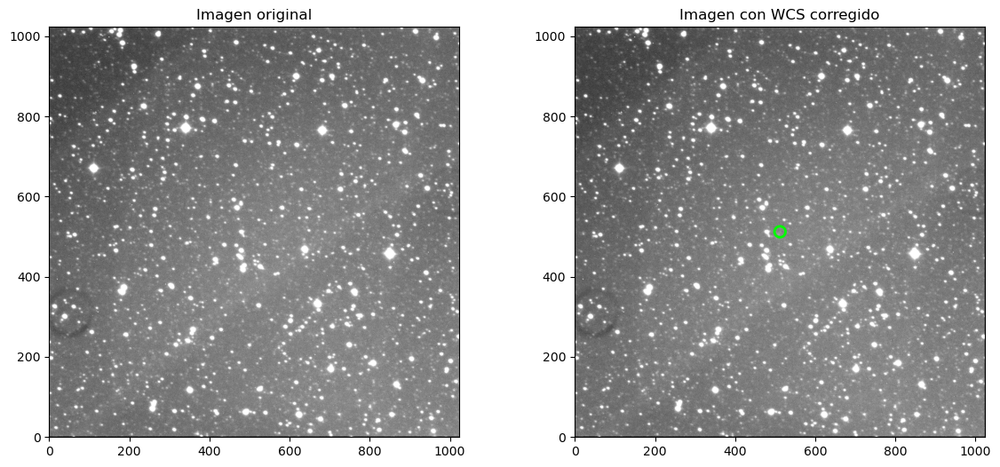

  x = -1705.718, y = 525.140


In [99]:
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import ZScaleInterval
import numpy as np
from astropy.coordinates import SkyCoord
import astropy.units as u

   

orig = fits.open("data/20250822/OGLE-2025-BLG-0397_i0006.fit")
wcsimg = fits.open("data/20250822/OGLE-2025-BLG-0397_i0006_wcs.fit")

orig_data = orig[0].data
wcs_data = wcsimg[0].data

orig_wcs = WCS(orig[0].header)
new_wcs = WCS(wcsimg[0].header)

# --------- Coordenada objetivo ---------
ra, dec = 269.69312570, -39.47283420
px, py = w.all_world2pix(ra, dec, 0)


# --------- Plots ---------
interval = ZScaleInterval()

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# ---- Imagen original ----
vmin, vmax = interval.get_limits(orig_data)
axes[0].imshow(orig_data, origin="lower", cmap="gray", vmin=vmin, vmax=vmax)
axes[0].set_title("Imagen original")

vmin, vmax = interval.get_limits(wcs_data)
axes[1].imshow(wcs_data, origin="lower", cmap="gray", vmin=vmin, vmax=vmax)
axes[1].set_title("Imagen con WCS corregido")
axes[1].scatter(px, py, s=80, facecolors='none', edgecolors='lime', lw=2)
axes[1].annotate(f"({new_x:.1f}, {new_y:.1f})", (new_x, new_y),
                 color="lime", fontsize=10)


In [98]:
from astropy.io import fits
from astropy.wcs import WCS
hdul = fits.open(output_file)
data = hdul[0].data
header = hdul[0].header
w = WCS(header)

ny, nx = data.shape
cx = nx / 2
cy = ny / 2

ra, dec = w.all_pix2world(cx, cy, 0)

print(f"Centro píxel = ({cx:.2f}, {cy:.2f})")
print(f"Centro RA/Dec = ({ra:.8f}, {dec:.8f})")

px, py = w.all_world2pix(ra, dec, 0)

print(f"Centro píxel = ({px:.2f}, {py:.2f})")

Centro píxel = (512.00, 512.00)
Centro RA/Dec = (269.69312570, -39.47283420)
Centro píxel = (512.00, 512.00)


In [64]:
import astropy
from astropy.io import fits
from astropy.io.fits import getheader
from astropy.io.fits import getval
from astropy import stats
from astropy.time import Time
import ccdproc
from ccdproc import ImageFileCollection
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
matplotlib.use('Agg')  # Backend no GUI, salva plots sin display
from pathlib import Path
import multiprocessing
import time
import os
import json
import requests
from pathlib import Path
from astropy.io import fits
from astropy.wcs import WCS
import warnings
from astropy.utils.exceptions import ErfaWarning
warnings.filterwarnings("ignore", category=ErfaWarning)


def apply_astrometry(input_fits, output_path, api_key="wuupmjpswkcbncws"):
    """
    Sube una imagen FITS a Astrometry.net, obtiene el WCS y genera
    un archivo <original>_wcs.fit con la solución astrométrica aplicada
    en el directorio 'output_path'.

    Aplica los keywords WCS críticos uno por uno para asegurar que
    el WCS final sea válido.
    """
    input_fits = Path(input_fits)
    output_path = Path(output_path)
    output_path.mkdir(parents=True, exist_ok=True)

    # ------------------ LOGIN ------------------
    print(f"[Astrometry.net] Iniciando sesión...")
    r = requests.post(
        "http://nova.astrometry.net/api/login",
        data={"request-json": json.dumps({"apikey": api_key})}
    ).json()
    session = r.get("session")
    if not session:
        raise RuntimeError("No se pudo iniciar sesión en Astrometry.net")
    print(f"[Astrometry.net] Sesión iniciada OK")

    # ------------------ SUBIR IMAGEN ------------------
    print(f"[Astrometry.net] Subiendo imagen {input_fits.name}...")
    with open(input_fits, "rb") as f:
        files = {"file": f}
        payload = {"request-json": json.dumps({"session": session})}
        r = requests.post("http://nova.astrometry.net/api/upload", files=files, data=payload).json()

    if "subid" not in r:
        raise RuntimeError(f"Error al subir la imagen: {r}")
    subid = r["subid"]
    print(f"[Astrometry.net] Imagen subida (SUBID {subid})")

    # ------------------ ESPERAR JOB ------------------
    print(f"[Astrometry.net] Esperando asignación de JOB...")
    jobid = None
    while jobid is None:
        time.sleep(5)
        jobs = requests.get(f"http://nova.astrometry.net/api/submissions/{subid}").json().get("jobs", [])
        if jobs and jobs[0] is not None:
            jobid = jobs[0]
    print(f"[Astrometry.net] JOB asignado: {jobid}")

    # ------------------ ESPERAR RESOLUCIÓN ------------------
    print(f"[Astrometry.net] Resolviendo campo...")
    status = "processing"
    while status == "processing":
        time.sleep(4)
        status = requests.get(f"http://nova.astrometry.net/api/jobs/{jobid}").json().get("status")
    if status != "success":
        raise RuntimeError(f"Astrometry.net no pudo resolver la imagen (status={status})")
    print(f"[Astrometry.net] Solución WCS obtenida!")

    # ------------------ DESCARGAR HEADER WCS ------------------
    wcs_url = f"http://nova.astrometry.net/wcs_file/{jobid}"
    print(f"[Astrometry.net] Descargando solución WCS...")
    wcs_raw = requests.get(wcs_url).content

    tmp_wcs = input_fits.with_name(input_fits.stem + "_tmp_wcs.fit")
    with open(tmp_wcs, "wb") as f:
        f.write(wcs_raw)

    # ------------------ APLICAR HEADER WCS ------------------
    print(f"[Astrometry.net] Combinando WCS con la imagen original...")

    # Abrir la imagen original
    with fits.open(input_fits, mode="readonly") as orig_hdu:
        data = orig_hdu[0].data
        orig_hdr = orig_hdu[0].header.copy()

    # Abrir la solución WCS
    with fits.open(tmp_wcs) as wcs_hdu:
        wcs_hdr = wcs_hdu[0].header

    # Definir los keywords críticos
    critical_keys = [
        "CRPIX1","CRPIX2",
        "CRVAL1","CRVAL2",
        "CTYPE1","CTYPE2",
        "CUNIT1","CUNIT2",
        "CD1_1","CD1_2","CD2_1","CD2_2",
        "PC1_1","PC1_2","PC2_1","PC2_2",
        "EQUINOX"
    ]

    # Copiar solo los keywords críticos al header original
    for key in critical_keys:
        if key in wcs_hdr:
            orig_hdr[key] = wcs_hdr[key]
    orig_hdr['ASTROMET'] = ('yes', 'Astrometric solution applied')

    # Guardar la imagen final
    output_fits = output_path / f"{input_fits.stem}_wcs.fits"
    fits.writeto(output_fits, data, orig_hdr, overwrite=True)

    print(f"[Astrometry.net] Imagen final guardada en: {output_fits}")

    # Limpiar archivo temporal
    if tmp_wcs.exists():
        tmp_wcs.unlink()


    return output_fits

In [88]:
import os
fits_files = [file for file in os.listdir("data/20250822bis") if file.startswith("FBOGLE") and "675" in file]
for file in fits_files:
    print(file)
    apply_astrometry("data/20250822bis/"+file, "data/20250822bis/OGLE-2025-BLG-0675/", api_key="wuupmjpswkcbncws")

FBOGLE-2025-BLG-0675_i0034.fits
[Astrometry.net] Iniciando sesión...
[Astrometry.net] Sesión iniciada OK
[Astrometry.net] Subiendo imagen FBOGLE-2025-BLG-0675_i0034.fits...
[Astrometry.net] Imagen subida (SUBID 14156803)
[Astrometry.net] Esperando asignación de JOB...
[Astrometry.net] JOB asignado: 14990997
[Astrometry.net] Resolviendo campo...
[Astrometry.net] Solución WCS obtenida!
[Astrometry.net] Descargando solución WCS...
[Astrometry.net] Combinando WCS con la imagen original...
[Astrometry.net] Imagen final guardada en: data/20250822bis/OGLE-2025-BLG-0675/FBOGLE-2025-BLG-0675_i0034_wcs.fit
FBOGLE-2025-BLG-0675_v0004.fits
[Astrometry.net] Iniciando sesión...
[Astrometry.net] Sesión iniciada OK
[Astrometry.net] Subiendo imagen FBOGLE-2025-BLG-0675_v0004.fits...
[Astrometry.net] Imagen subida (SUBID 14156807)
[Astrometry.net] Esperando asignación de JOB...
[Astrometry.net] JOB asignado: 14991001
[Astrometry.net] Resolviendo campo...
[Astrometry.net] Solución WCS obtenida!
[Astromet

In [77]:
fits_file = "data/20250822bis/OGLE-2025-BLG-0675/FBOGLE-2025-BLG-0675_i0033_wcs.fits" # ajustá el nombre si hace falta
apply_astrometry(fits_file, ".", api_key="wuupmjpswkcbncws")

[Astrometry.net] Iniciando sesión...
[Astrometry.net] Sesión iniciada OK
[Astrometry.net] Subiendo imagen FBOGLE-2025-BLG-0675_i0033_wcs.fits...
[Astrometry.net] Imagen subida (SUBID 14156738)
[Astrometry.net] Esperando asignación de JOB...
[Astrometry.net] JOB asignado: 14990932
[Astrometry.net] Resolviendo campo...
[Astrometry.net] Solución WCS obtenida!
[Astrometry.net] Descargando solución WCS...
[Astrometry.net] Combinando WCS con la imagen original...
[Astrometry.net] Imagen final guardada en: FBOGLE-2025-BLG-0675_i0033_wcs_wcs.fit


PosixPath('FBOGLE-2025-BLG-0675_i0033_wcs_wcs.fit')

In [89]:
from astropy.io import fits
from astropy.wcs import WCS
import numpy as np

fits_file = "data/20250822bis/OGLE-2025-BLG-0675/FBOGLE-2025-BLG-0675_i0033_wcs.fits" # ajustá el nombre si hace falta
print(f"\n=== TEST WCS PARA {fits_file} ===")

hdr = fits.getheader(fits_file)

# 1) Mostrar keywords críticos
keys = ["CRPIX1","CRPIX2","CRVAL1","CRVAL2",
        "CD1_1","CD1_2","CD2_1","CD2_2",
        "CTYPE1","CTYPE2"]

print("\n--- Keywords críticos ---")
for k in keys:
    print(f"{k:8s} = {hdr.get(k)}")

# 2) Verificar valores numéricos
print("\n--- Validación numérica ---")
for k in ["CRVAL1","CRVAL2","CD1_1","CD2_2"]:
    v = hdr.get(k)
    try:
        float(v)
        print(f"{k}: OK ({v})")
    except Exception:
        print(f"{k}: ❌ NO numérico ({v})")

# 3) Inicializar WCS
print("\n--- Inicialización WCS ---")
try:
    w = WCS(hdr)
    print("WCS creado correctamente")
except Exception as e:
    print("❌ Error creando WCS:", e)
    raise

# 4) Test mundo → píxel
print("\n--- Test world_to_pixel ---")
ra_test  = np.array([hdr["CRVAL1"]], dtype=float)
dec_test = np.array([hdr["CRVAL2"]], dtype=float)

x, y = w.world_to_pixel_values(ra_test, dec_test)
print(f"RA,Dec centro = {ra_test[0]}, {dec_test[0]}")
print(f"x,y pixel     = {x[0]}, {y[0]}")

# 5) Test inverso píxel → mundo
print("\n--- Test pixel_to_world ---")
ra2, dec2 = w.pixel_to_world_values(x, y)
print(f"RA,Dec vuelta = {ra2[0]}, {dec2[0]}")

# 6) Chequeo coherencia
dra  = abs(ra2[0]  - ra_test[0])
ddec = abs(dec2[0] - dec_test[0])

print("\n--- Consistencia ---")
print(f"ΔRA  = {dra}")
print(f"ΔDec = {ddec}")

if dra < 1e-6 and ddec < 1e-6:
    print("✅ WCS consistente")
else:
    print("❌ WCS INCONSISTENTE")



=== TEST WCS PARA data/20250822bis/OGLE-2025-BLG-0675/FBOGLE-2025-BLG-0675_i0033_wcs.fits ===

--- Keywords críticos ---
CRPIX1   = 529.569976807
CRPIX2   = 686.502487183
CRVAL1   = 276.946021948
CRVAL2   = -26.6429029685
CD1_1    = -0.000155250760476
CD1_2    = 6.07673901979e-07
CD2_1    = -4.82955328174e-07
CD2_2    = -0.000155235999026
CTYPE1   = RA---TAN-SIP
CTYPE2   = DEC--TAN-SIP

--- Validación numérica ---
CRVAL1: OK (276.946021948)
CRVAL2: OK (-26.6429029685)
CD1_1: OK (-0.000155250760476)
CD2_2: OK (-0.000155235999026)

--- Inicialización WCS ---
WCS creado correctamente

--- Test world_to_pixel ---
RA,Dec centro = 276.946021948, -26.6429029685
x,y pixel     = 528.5699768070001, 685.5024871830226

--- Test pixel_to_world ---
RA,Dec vuelta = 276.946021948, -26.64290296849999

--- Consistencia ---
ΔRA  = 0.0
ΔDec = 1.0658141036401503e-14
✅ WCS consistente


In [93]:
import os
from astropy.io import fits

base_path = "data/20250822bis/OGLE-2025-BLG-0675"

fits_files = [file for file in os.listdir("data/20250822bis/OGLE-2025-BLG-0675/") if file.startswith("FBOGLE") and "675" in file]


print(f"Archivos encontrados: {len(fits_files)}\n")

for file in sorted(fits_files):
    path = os.path.join(base_path, file)

    with fits.open(path) as hdul:
        hdr = hdul[0].header

    imagetyp = hdr.get("IMAGETYP", None)
    calibz   = hdr.get("CALIBZ", None)
    calibf   = hdr.get("CALIBF", None)
    filters  = hdr.get("FILTERS", None)
    astromet = hdr.get("ASTROMET", None)

    ok_imagetyp = imagetyp == "object"
    ok_calibz   = calibz == "subtracted bias"
    ok_calibf   = calibf == "flat correction"
    ok_filter   = filters is not None
    ok_astromet = (astromet == "yes")

    print(f"{file}")
    print(f"  IMAGETYP : {imagetyp}  -> {'OK' if ok_imagetyp else 'FAIL'}")
    print(f"  CALIBZ   : {calibz}    -> {'OK' if ok_calibz else 'FAIL'}")
    print(f"  CALIBF   : {calibf}    -> {'OK' if ok_calibf else 'FAIL'}")
    print(f"  FILTERS  : {filters}  -> {'OK' if ok_filter else 'FAIL'}")
    print(f"  ASTROMET : {astromet} -> {'OK' if ok_astromet else 'FAIL'}")

    if all([ok_imagetyp, ok_calibz, ok_calibf, ok_filter]):
        print("  ==> ENTRARÍA en files_filtered")
    else:
        print("  ==> NO entra en files_filtered")

    print("-" * 60)


Archivos encontrados: 17

FBOGLE-2025-BLG-0675_i0001_wcs.fits
  IMAGETYP : object  -> OK
  CALIBZ   : subtracted bias    -> OK
  CALIBF   : flat correction    -> OK
  FILTERS  : I  -> OK
  ASTROMET : None -> FAIL
  ==> ENTRARÍA en files_filtered
------------------------------------------------------------
FBOGLE-2025-BLG-0675_i0002_wcs.fits
  IMAGETYP : object  -> OK
  CALIBZ   : subtracted bias    -> OK
  CALIBF   : flat correction    -> OK
  FILTERS  : I  -> OK
  ASTROMET : None -> FAIL
  ==> ENTRARÍA en files_filtered
------------------------------------------------------------
FBOGLE-2025-BLG-0675_i0031_wcs.fits
  IMAGETYP : object  -> OK
  CALIBZ   : subtracted bias    -> OK
  CALIBF   : flat correction    -> OK
  FILTERS  : I  -> OK
  ASTROMET : None -> FAIL
  ==> ENTRARÍA en files_filtered
------------------------------------------------------------
FBOGLE-2025-BLG-0675_i0032_wcs.fits
  IMAGETYP : object  -> OK
  CALIBZ   : subtracted bias    -> OK
  CALIBF   : flat correction  

### Catalogos

In [35]:
import pandas as pd
objetos = pd.read_csv("data/objetos.csv")
objetos

,objeto,ra_deg,dec_deg,ra_ecu,dec_ecu
0,OGLE-2025-BLG-0451,269.540958,-19.978000,17:58:09.83,-19:58:40.8
1,OGLE-2025-BLG-0397,269.713208,-39.597333,17:58:51.17,-39:35:50.4
2,OGLE-2025-BLG-0675,276.915333,-26.628806,18:27:39.68,-26:37:43.7
3,OGLE-2025-GD-0001,242.542333,-55.793667,16:10:10.16,-55:47:37.2


In [42]:
dd = pd.read_csv("data/objetos.csv").query("objeto == 'OGLE-2025-BLG-0397'")
ra, dec = dd[["ra_deg", "dec_deg"]].values[0]
ra

269.71320833333334

In [91]:
"FBOGLE-2025-BLG-0397_i0001_wcs.fit".split('_')[0][2:]

'OGLE-2025-BLG-0397'

In [21]:
from astropy.io import fits
from astropy.wcs import WCS
import numpy as np

img = "data/20250822/OGLE-2025-BLG-0397/FBOGLE-2025-BLG-0397_i0001_wcs.fits"
coo = "data/objetos/OGLE-2025-BLG-0397/OGLE-2025-BLG-0397_refpsf.coo"

# Cargo imagen
h = fits.open(img)[0]
w = WCS(h.header)

# Leo archivo de ref
data = np.loadtxt(coo)

print("Contenido .coo:", data)

# Si son RA/Dec:
ras = data[:,0]
decs = data[:,1]

# Convertir a pixeles
xs, ys = w.world_to_pixel_values(ras, decs)

print("Pixeles:", list(zip(xs, ys)))

# Chequear si caen dentro de la imagen
ny, nx = h.data.shape

for i,(x,y) in enumerate(zip(xs,ys)):
    inside = (0 <= x < nx) and (0 <= y < ny)
    print(f"Star {i+1}: inside_frame = {inside}, xy = ({x:.1f}, {y:.1f})")


Contenido .coo: [[269.746902 -39.664719  13.307   ]
 [269.795055 -39.630676  13.319   ]
 [269.650685 -39.654308  13.409   ]
 [269.749748 -39.640972  13.591   ]
 [269.802405 -39.621559  13.705   ]
 [269.78026  -39.646549  13.917   ]
 [269.767206 -39.659458  13.969   ]
 [269.732463 -39.653008  14.221   ]]
Pixeles: [(268.746902, -40.664719), (268.795055, -40.630676), (268.650685, -40.654308), (268.749748, -40.640972), (268.802405, -40.621559), (268.78026, -40.646549), (268.767206, -40.659458), (268.732463, -40.653008)]
Star 1: inside_frame = False, xy = (268.7, -40.7)
Star 2: inside_frame = False, xy = (268.8, -40.6)
Star 3: inside_frame = False, xy = (268.7, -40.7)
Star 4: inside_frame = False, xy = (268.7, -40.6)
Star 5: inside_frame = False, xy = (268.8, -40.6)
Star 6: inside_frame = False, xy = (268.8, -40.6)
Star 7: inside_frame = False, xy = (268.8, -40.7)
Star 8: inside_frame = False, xy = (268.7, -40.7)


a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]


In [111]:
from astropy.io import fits
img = "data/20250822/OGLE-2025-BLG-0397/FBOGLE-2025-BLG-0397_i0001_wcs.fit"
h = fits.open(img)[0].header
print(h)



SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -64 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                 1024                                                  NAXIS2  =                 1024                                                  CCDSIZE = '[1:1024,1:1024] '     / CCD size                                     CCDSUM  = '1 1 '                 / CCD binning factors                          PIXSIZE1=                 24.0   / pixel size for axis 1 (um)                   PIXSIZE2=                 24.0   / pixel size for axis 2 (um)                   ADCRATE = '          '           / analog to digital converter rate             GAIN    =                  2.0 / CCD gain (e-/ADU)                              RDNOISE =                 15.7 / Readout noise (e- RMS)                         CAMTEM  =                -49.0   / camer

In [113]:
def get_image_fov_arcmin(wcs_header, nx, ny):
    """
    Calcula el tamaño del CCD en arcmin usando el WCS.
    Devuelve: width_arcmin, height_arcmin, diag_arcmin
    """

    w = WCS(wcs_header)

    # cuatro esquinas del CCD (píxeles)
    corners_px = np.array([
        [0, 0],
        [nx-1, 0],
        [0, ny-1],
        [nx-1, ny-1]
    ])

    # convertir a RA/DEC
    ras, decs = w.pixel_to_world_values(corners_px[:,0], corners_px[:,1])

    # convertir diferencias a arcmin
    width_deg  = np.abs(ras[1] - ras[0]) * np.cos(np.radians(np.mean(decs)))  # corrección por cos(dec)
    height_deg = np.abs(decs[2] - decs[0])
    diag_deg   = np.sqrt(width_deg**2 + height_deg**2)

    return width_deg * 60, height_deg * 60, diag_deg * 60


=== Verificación WCS ===
WCS presente y válido
Centro campo: RA = 269.670056454 Dec = -39.4889087492
ASTROMET keyword: yes
Target debería estar en píxeles: x ≈ 409.5, y ≈ 1301.8


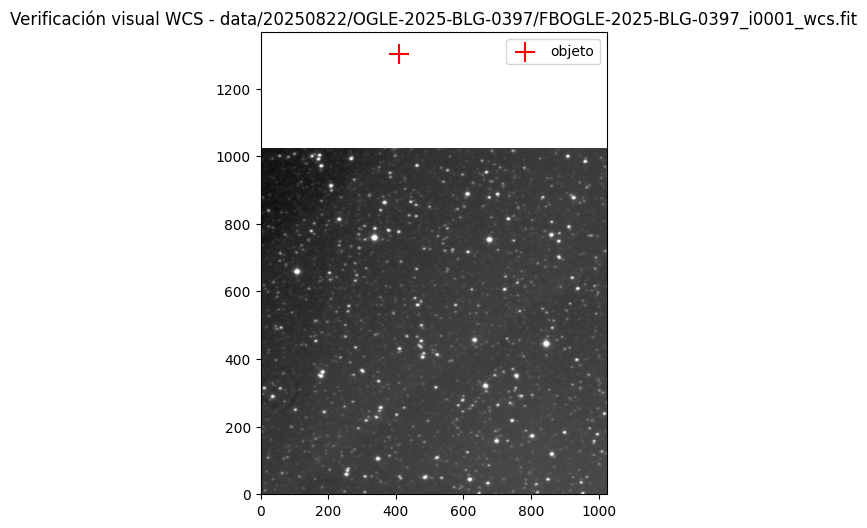

In [22]:
from astropy.io import fits
from astropy.wcs import WCS
import matplotlib.pyplot as plt
from astropy.visualization import simple_norm
objeto = "OGLE-2025-BLG-0397"
obj_coords = objetos[objetos["objeto"]==objeto]
noche = 20250822
# Cambiar estos valores
image_file = f'data/{noche}/{objeto}/FB{objeto}_i0001_wcs.fit'  # una de tus *_wcs.fits
ra_target = 269.7132083333333   # RA del objeto en grados
dec_target = -39.59733333333334 # Dec del objeto en grados
ra_target =  269.540958 # OGLE-2025-BLG-0451
dec_target = -19.978000 # OGLE-2025-BLG-0451
ra_target =  obj_coords["ra_deg"].values[0]
dec_target = obj_coords["dec_deg"].values[0]

hdul = fits.open(image_file)
header = hdul[0].header
data = hdul[0].data
w = WCS(header)

print("=== Verificación WCS ===")
if 'CRVAL1' in header and 'CRVAL2' in header:
    print("WCS presente y válido")
    print("Centro campo: RA =", header['CRVAL1'], "Dec =", header['CRVAL2'])
    print("ASTROMET keyword:", header.get('ASTROMET', 'no encontrado'))
else:
    print("NO tiene WCS")

# Posición del target en píxeles
x, y = w.world_to_pixel_values(ra_target, dec_target)
print(f"Target debería estar en píxeles: x ≈ {x:.1f}, y ≈ {y:.1f}")


norm = simple_norm(data, 'sqrt', percent=99.5)
plt.figure(figsize=(6,6))
plt.imshow(data, cmap='gray', norm=norm, origin='lower')
plt.scatter(x, y, c='red', s=200, marker='+', label='objeto')
plt.title(f'Verificación visual WCS - {image_file}')
plt.legend()
plt.show()

hdul.close()

In [29]:
x

array([409.50998331])

=== Verificación WCS ===
WCS presente y válido
Centro campo: RA = 269.575680602 Dec = -19.9712186922
ASTROMET keyword: yes
Target debería estar en píxeles: x ≈ 548.9, y ≈ 553.1


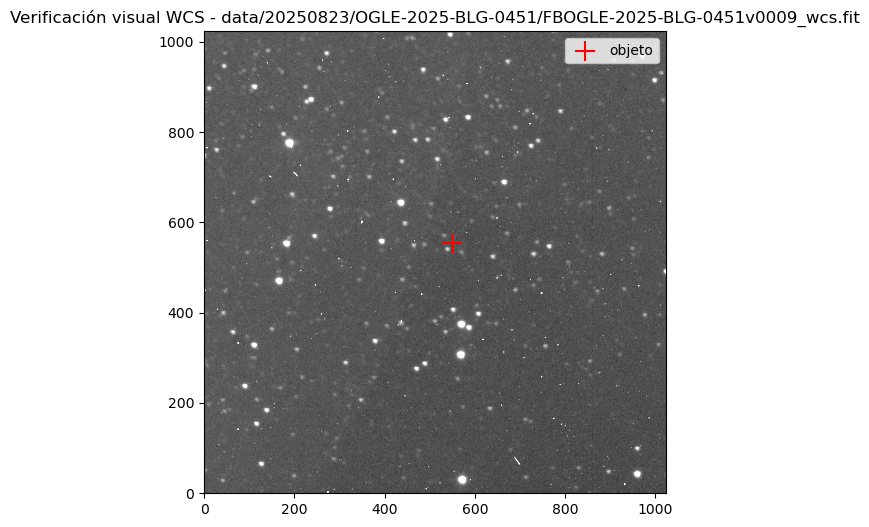

In [15]:
from astropy.io import fits
from astropy.wcs import WCS
import matplotlib.pyplot as plt
from astropy.visualization import simple_norm

# Cambiar estos valores
image_file = 'data/20250823/OGLE-2025-BLG-0451/FBOGLE-2025-BLG-0451v0009_wcs.fit'  # una de tus *_wcs.fits
ra_target = 269.7132083333333   # RA del objeto en grados
dec_target = -39.59733333333334 # Dec del objeto en grados
ra_target =  269.540958 # OGLE-2025-BLG-0451
dec_target = -19.978000 # OGLE-2025-BLG-0451

hdul = fits.open(image_file)
header = hdul[0].header
data = hdul[0].data
w = WCS(header)

print("=== Verificación WCS ===")
if 'CRVAL1' in header and 'CRVAL2' in header:
    print("WCS presente y válido")
    print("Centro campo: RA =", header['CRVAL1'], "Dec =", header['CRVAL2'])
    print("ASTROMET keyword:", header.get('ASTROMET', 'no encontrado'))
else:
    print("NO tiene WCS")

# Posición del target en píxeles
x, y = w.world_to_pixel_values(ra_target, dec_target)
print(f"Target debería estar en píxeles: x ≈ {x:.1f}, y ≈ {y:.1f}")


norm = simple_norm(data, 'sqrt', percent=99.5)
plt.figure(figsize=(6,6))
plt.imshow(data, cmap='gray', norm=norm, origin='lower')
plt.scatter(x, y, c='red', s=200, marker='+', label='objeto')
plt.title(f'Verificación visual WCS - {image_file}')
plt.legend()
plt.show()

hdul.close()

In [23]:
# Cell 1: Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import simple_norm
from astropy.stats import sigma_clipped_stats
import os
import pandas as pd

In [24]:
# Cell 2: Define paths (adjust these to your local paths)
image_dir = '/home/knowogrodski/Documentos/process_HSH_SN/data/objetos/OGLE-2025-BLG-0397'
ref_coo_path = os.path.join(image_dir, 'OGLE-2025-BLG-0397_refpsf.coo')
sn_coo_path = os.path.join(image_dir, 'OGLE-2025-BLG-0397.coo')  # If exists, otherwise skip
image_dir = '/home/knowogrodski/Documentos/process_HSH_SN/data/20250822/OGLE-2025-BLG-0397'
# List all FITS images in the directory (e.g., the _wcs.fits files)
image_files = [f for f in os.listdir(image_dir) if f.endswith('_wcs.fits')]
print("Found images:", image_files)

Found images: ['FBOGLE-2025-BLG-0397_i0005_wcs.fits', 'FBOGLE-2025-BLG-0397_v0003_wcs.fits', 'FBOGLE-2025-BLG-0397_i0003_wcs.fits', 'FBOGLE-2025-BLG-0397_v0004_wcs.fits', 'FBOGLE-2025-BLG-0397_i0002_wcs.fits', 'FBOGLE-2025-BLG-0397_v0005_wcs.fits', 'FBOGLE-2025-BLG-0397_i0004_wcs.fits', 'FBOGLE-2025-BLG-0397_i0006_wcs.fits', 'FBOGLE-2025-BLG-0397_v0006_wcs.fits', 'FBOGLE-2025-BLG-0397_i0001_wcs.fits', 'FBOGLE-2025-BLG-0397_v0002_wcs.fits', 'FBOGLE-2025-BLG-0397_v0007_wcs.fits', 'FBOGLE-2025-BLG-0397_v0001_wcs.fits']


In [168]:
# Cell 3: Load and check data for each image (headers, stats, NaNs)
for img_file in image_files:
    full_path = os.path.join(image_dir, img_file)
    if "i0001" in full_path:
        with fits.open(full_path) as hdul:
            print(full_path)
            header = hdul[0].header
            data = hdul[0].data.astype(float)  # Ensure float for stats
            print(header)
            #Print key header info
            # print(f"\n--- Header for {img_file} ---")
            # print("OBJECT:", header.get('OBJECT', 'N/A'))
            # print("FILTER:", header.get('FILTERS', 'N/A'))
            # print("EXPTIME:", header.get('EXPTIME', 'N/A'))
            # print("RA/DEC:", header.get('RA', 'N/A'), header.get('DEC', 'N/A'))
            # print("WCS Present:", 'WCSAXES' in header)
            
            # Compute stats
            mean, median, std = sigma_clipped_stats(data, sigma=3.0)
            print("Data stats (min, max, mean, median, std):", data.min(), data.max(), data.mean(), median, std)
            
            # Check for NaNs/infs
            nan_count = np.sum(np.isnan(data))
            inf_count = np.sum(np.isinf(data))
            print("NaNs count:", nan_count)
            print("Infs count:", inf_count)
            
            # Background estimate (simple, for debug)
            bkg_mean = np.median(data)
            print("Estimated background mean:", bkg_mean)

/home/knowogrodski/Documentos/process_HSH_SN/data/20250822/OGLE-2025-BLG-0397/FBOGLE-2025-BLG-0397_i0001_wcs.fits
SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -64 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                 1024                                                  NAXIS2  =                 1024                                                  EXTEND  =                    T                                                  CCDSIZE = '[1:1024,1:1024] '     / CCD size                                     CCDSUM  = '1 1 '                 / CCD binning factors                          PIXSIZE1=                 24.0   / pixel size for axis 1 (um)                   PIXSIZE2=                 24.0   / pixel size for axis 2 (um)                   ADCRATE = '          '           / analog to digital converter rate             GAIN  

In [167]:
with fits.open("data/20250822/FBOGLE-2025-BLG-0397_i0001_tmp_wcs.fit") as hdul:
    print(full_path)
    header = hdul[0].header
    #data = hdul[0].data.astype(float)  # Ensure float for stats
    print(header)

/home/knowogrodski/Documentos/process_HSH_SN/data/20250822/OGLE-2025-BLG-0397/FBOGLE-2025-BLG-0397_v0001_wcs.fits
SIMPLE  =                    T / Standard FITS file                             BITPIX  =                    8 / ASCII or bytes array                           NAXIS   =                    0 / Minimal header                                 EXTEND  =                    T / There may be FITS ext                          WCSAXES =                    2 / no comment                                     CTYPE1  = 'RA---TAN-SIP' / TAN (gnomic) projection + SIP distortions            CTYPE2  = 'DEC--TAN-SIP' / TAN (gnomic) projection + SIP distortions            EQUINOX =               2000.0 / Equatorial coordinates definition (yr)         LONPOLE =                180.0 / no comment                                     LATPOLE =                  0.0 / no comment                                     CRVAL1  =        269.670056454 / RA  of reference point                         CRVAL2

In [126]:
# Cell 4: Load reference stars from .coo file
if os.path.exists(ref_coo_path):
    ref_stars = np.loadtxt(ref_coo_path, comments='#')  # Skip commented lines
    if ref_stars.ndim == 1:
        ref_stars = ref_stars.reshape(1, -1)  # Handle single star
    print("Reference stars (x, y):")
    print(ref_stars)
else:
    print("No refpsf.coo file found.")
    ref_stars = np.array([])

# Load SN position if available
if os.path.exists(sn_coo_path):
    sn_data = np.loadtxt(sn_coo_path)
    sn_ra, sn_dec, center_ra, center_dec = sn_data[0], sn_data[1], sn_data[2], sn_data[3]
    print("SN position (RA, DEC):", sn_ra, sn_dec)
    print("Center (RA, DEC):", center_ra, center_dec)
else:
    print("No _sn.coo file found.")
    sn_ra, sn_dec = None, None

# Load catalog if exists (for comparison)
if os.path.exists(catalog_path):
    cat_df = pd.read_csv(catalog_path)
    print("\nCatalog head:")
    print(cat_df.head())
    cat_positions = cat_df[['x', 'y']].values  # Pixel positions if available
else:
    cat_positions = np.array([])
    print("No catalog.csv found.")

Reference stars (x, y):
[[269.58108945 -39.51707395]
 [269.72181321 -39.52907949]
 [269.69969398 -39.46555678]
 [269.74175026 -39.54918278]
 [269.76063144 -39.55070528]]


ValueError: could not convert string '17:58:51.17' to float64 at row 0, column 1.

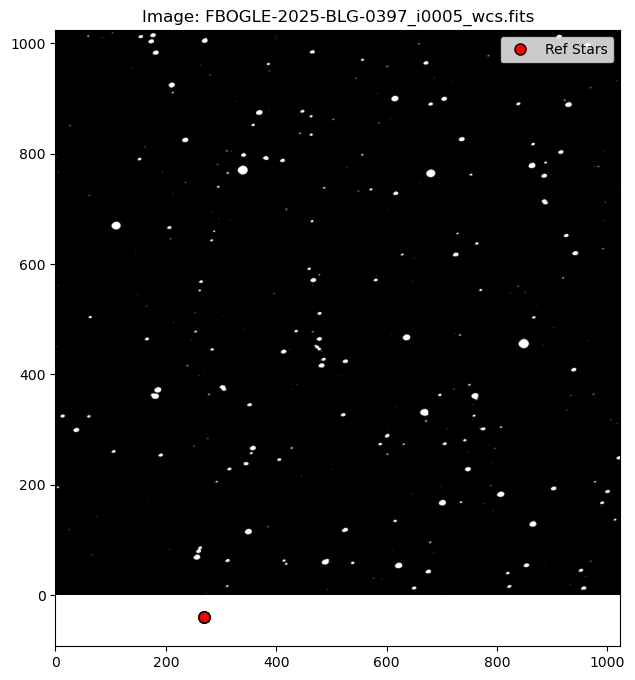

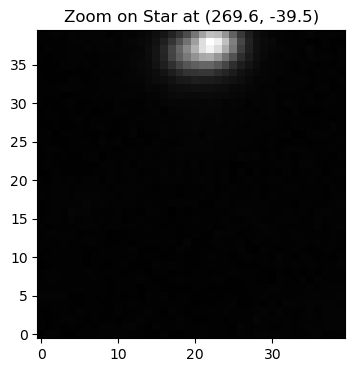

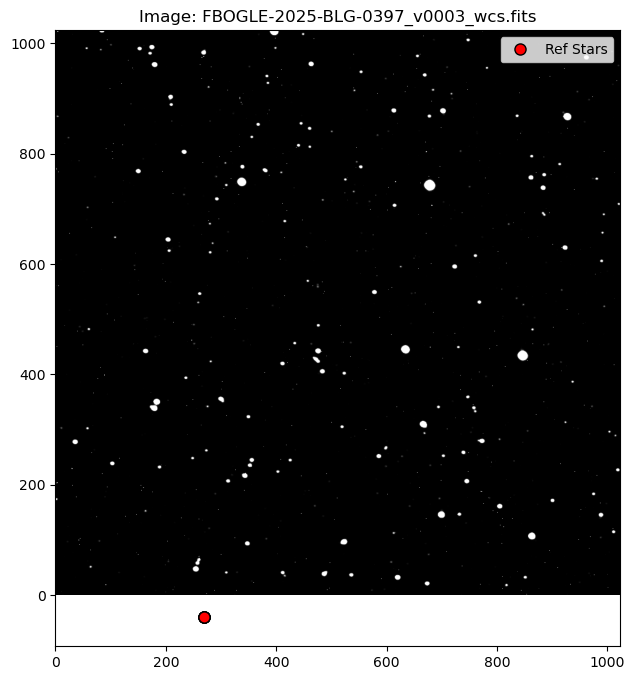

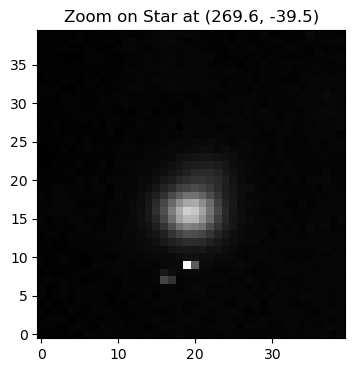

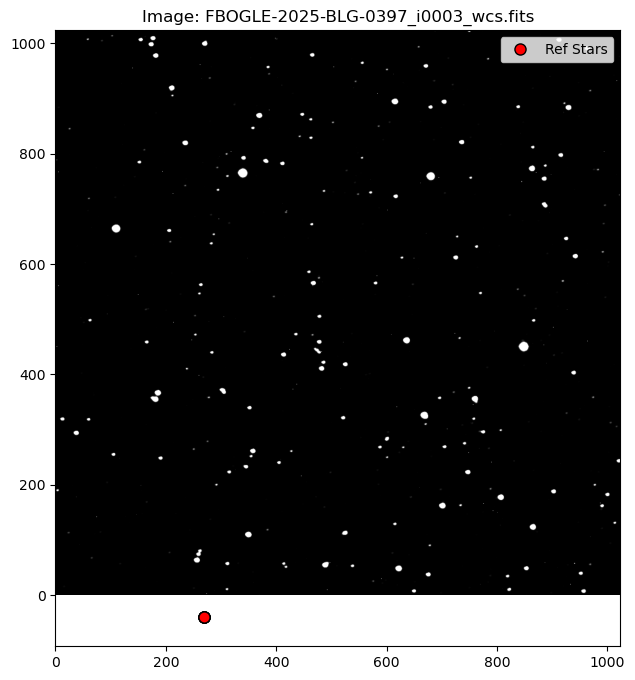

...

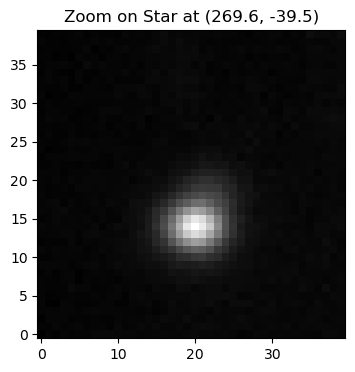

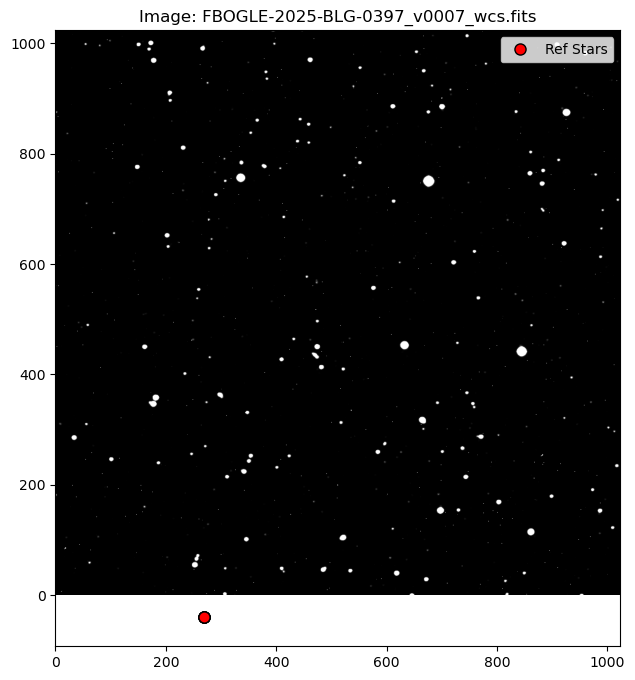

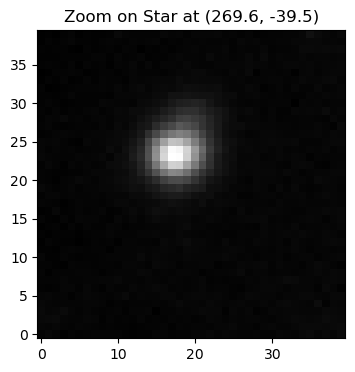

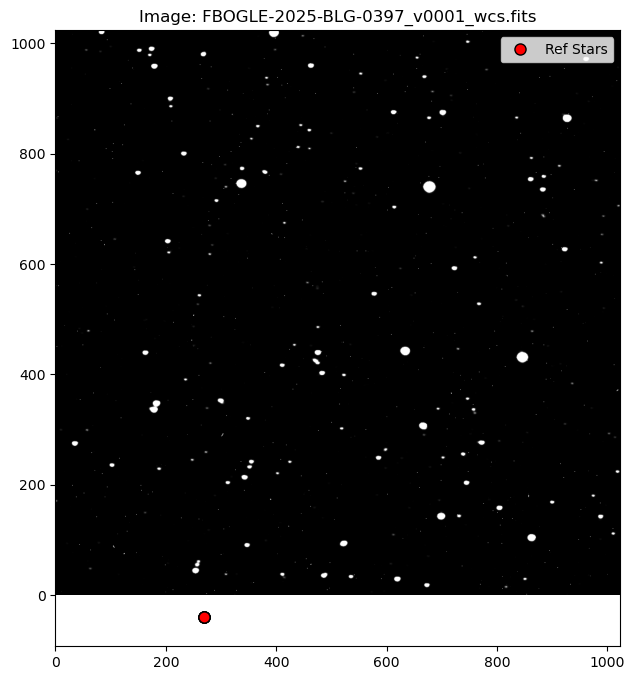

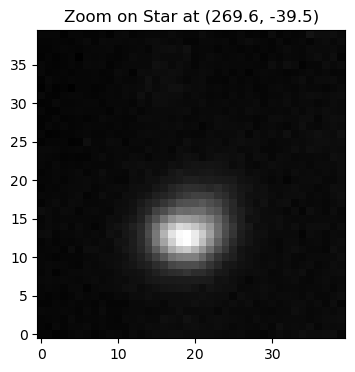

In [127]:
# Cell 5: Plot each image with reference stars and SN overlaid
for img_file in image_files:
    full_path = os.path.join(image_dir, img_file)
    with fits.open(full_path) as hdul:
        data = hdul[0].data.astype(float)
        header = hdul[0].header
        wcs = WCS(header) if 'WCSAXES' in header else None
        
        # Convert SN RA/DEC to pixels if WCS available
        if wcs and sn_ra is not None:
            sn_pix = wcs.world_to_pixel_values(sn_ra, sn_dec)
            sn_x, sn_y = sn_pix[0], sn_pix[1]
        else:
            sn_x, sn_y = None, None  # Or use approximate center
        
        # Plot
        fig, ax = plt.subplots(figsize=(8, 8))
        norm = simple_norm(data, 'power', power=5., percent=99.)
        ax.imshow(data, norm=norm, cmap='gray', origin='lower')
        
        # Plot reference stars
        if len(ref_stars) > 0:
            ax.plot(ref_stars[:, 0], ref_stars[:, 1], 'o', color='red', ms=8, mec='k', label='Ref Stars')
        
        # Plot SN if available
        if sn_x is not None:
            ax.plot(sn_x, sn_y, 'x', color='blue', ms=10, label='SN Position')
        
        # Plot catalog positions if available
        if len(cat_positions) > 0:
            ax.plot(cat_positions[:, 0], cat_positions[:, 1], 's', color='green', ms=6, mfc='none', label='Catalog')
        
        ax.set_title(f"Image: {img_file}")
        ax.legend()
        plt.show()
        
        # Optional: Zoom on a region (e.g., around a star)
        # Example for first ref star
        if len(ref_stars) > 0:
            x, y = ref_stars[0]
            chunk = data[int(y)-20:int(y)+20, int(x)-20:int(x)+20]
            fig, ax = plt.subplots(figsize=(4, 4))
            ax.imshow(chunk, cmap='gray', origin='lower')
            ax.set_title(f"Zoom on Star at ({x:.1f}, {y:.1f})")
            plt.show()

Mean difference between images: 1969.876978291529


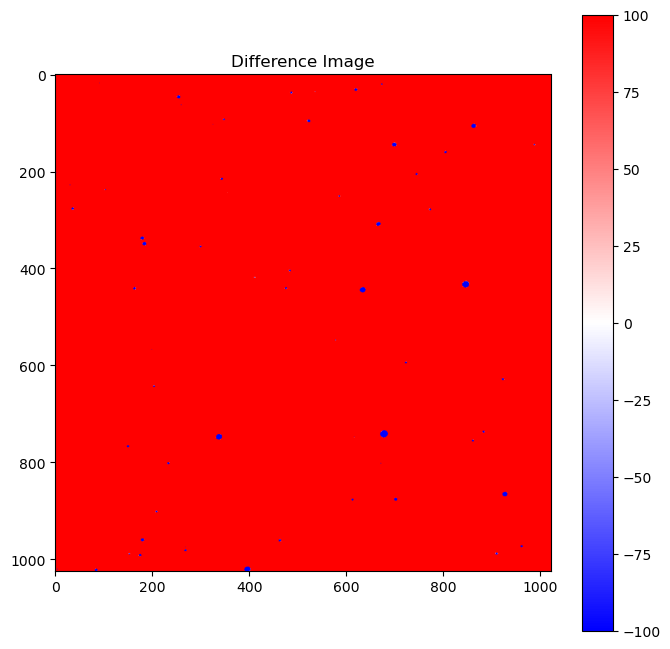

In [128]:
# Cell 6: Check alignment between two images (pick first two as example)
if len(image_files) >= 2:
    img1_path = os.path.join(image_dir, image_files[0])
    img2_path = os.path.join(image_dir, image_files[1])
    
    data1 = fits.getdata(img1_path)
    data2 = fits.getdata(img2_path)
    
    # Simple difference (assumes same shape)
    if data1.shape == data2.shape:
        diff = data1 - data2
        mean_diff = np.mean(diff)
        print("Mean difference between images:", mean_diff)
        
        # Plot difference
        plt.figure(figsize=(8, 8))
        plt.imshow(diff, cmap='bwr', vmin=-100, vmax=100)  # Adjust vmin/vmax based on your data
        plt.colorbar()
        plt.title("Difference Image")
        plt.show()
    else:
        print("Images have different shapes - alignment issue?")

In [129]:
# Cell 7: Basic flux check on reference stars (aperture photometry example)
from photutils.aperture import CircularAperture, aperture_photometry

for img_file in image_files[:1]:  # Test on first image
    full_path = os.path.join(image_dir, img_file)
    data = fits.getdata(full_path)
    
    if len(ref_stars) > 0:
        apertures = CircularAperture(ref_stars, r=5.0)  # Adjust radius based on FWHM ~3-5 pix?
        phot_table = aperture_photometry(data, apertures)
        print("\nFlux for ref stars in", img_file)
        print(phot_table)
        
        # Background subtract example
        bkg = np.median(data)
        net_flux = phot_table['aperture_sum'] - (apertures.area * bkg)
        print("Net flux (bkg subtracted):", net_flux)
        
        # Check for invalid fluxes
        invalid = np.where(net_flux <= 0)[0]
        if len(invalid) > 0:
            print("Invalid fluxes for stars:", invalid)


Flux for ref stars in FBOGLE-2025-BLG-0397_i0005_wcs.fits
 id      xcenter            ycenter       aperture_sum
           pix                pix                     
--- ------------------ ------------------ ------------
  1  269.5810894530378 -39.51707394664857          nan
  2 269.72181321282426 -39.52907948754817          nan
  3  269.6996939768387 -39.46555678394877          nan
  4  269.7417502644831 -39.54918277630485          nan
  5 269.76063144342913 -39.55070528494427          nan
Net flux (bkg subtracted): aperture_sum
------------
         nan
         nan
         nan
         nan
         nan


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import simple_norm
from astroquery.gaia import Gaia
from astropy import units as u

# Pegá aquí la función get_image_fov_arcmin y generate_auto_coo modificada (del código arriba)

# Parámetros para tu objeto (ajustá si es necesario)
ra_center = 269.7132083333333  # Del output anterior
dec_center = -39.59733333333334
wcs_image_ref = 'FBOGLE-2025-BLG-0397_i0001_wcs.fits'  # Imagen de referencia para WCS
output_coo = 'OGLE-2025-BLG-0397_refpsf_strict.coo'

positions = np.loadtxt(output_coo)

# Lista de imágenes a plotear (todas las tuyas)
image_files = [
    'FBOGLE-2025-BLG-0397_i0001_wcs.fits',
    'FBOGLE-2025-BLG-0397_i0002_wcs.fits',
    'FBOGLE-2025-BLG-0397_i0003_wcs.fits',
    'FBOGLE-2025-BLG-0397_i0004_wcs.fits',
    'FBOGLE-2025-BLG-0397_i0005_wcs.fits',
    'FBOGLE-2025-BLG-0397_i0006_wcs.fits'
]

# Plotear cada imagen con estrellas
fig, axs = plt.subplots(2, 3, figsize=(15, 10))  # 2x3 grid para 6 imágenes
axs = axs.flatten()

for i, img_file in enumerate(image_files):
    hdul = fits.open(img_file)
    data = hdul[0].data
    norm = simple_norm(data, 'sqrt', percent=99.5)  # Normalización para visualización
    axs[i].imshow(data, cmap='gray', norm=norm, origin='lower')
    axs[i].scatter(positions[:, 0], positions[:, 1], c='red', s=50, marker='o', edgecolor='white', label='Ref Stars')
    axs[i].set_title(f'Imagen: {img_file}')
    axs[i].legend()
    hdul.close()

plt.tight_layout()
plt.show()

In [139]:
from astropy.io import fits
from astropy.wcs import WCS
import matplotlib.pyplot as plt

def plot_ref_stars(image_path, ref_stars):
    hdul = fits.open(image_path)
    wcs_img = WCS(hdul[0].header)
    data = hdul[0].data

    fig, ax = plt.subplots(figsize=(8,8))
    ax.imshow(data, origin='lower', cmap='gray', vmin=np.percentile(data,5), vmax=np.percentile(data,99))
    for ra, dec in ref_stars:
        x, y = wcs_img.world_to_pixel_values(ra, dec)
        ax.plot(x, y, 'ro', markersize=6)
        
    plt.show()


In [140]:
# Cell 2: Define paths (adjust these to your local paths)
image_dir = '/home/knowogrodski/Documentos/process_HSH_SN/data/objetos/OGLE-2025-BLG-0397/'
ref_coo_path = os.path.join(image_dir, 'OGLE-2025-BLG-0397_refpsf.coo')
sn_coo_path = os.path.join(image_dir, 'OGLE-2025-BLG-0397.coo')  # If exists, otherwise skip
image_dir = '/home/knowogrodski/Documentos/process_HSH_SN/data/20250822/OGLE-2025-BLG-0397/'
# List all FITS images in the directory (e.g., the _wcs.fits files)
image_files = [f for f in os.listdir(image_dir) if f.endswith('_wcs.fits')]
print("Found images:", image_files)

Found images: ['FBOGLE-2025-BLG-0397_i0005_wcs.fits', 'FBOGLE-2025-BLG-0397_v0003_wcs.fits', 'FBOGLE-2025-BLG-0397_i0003_wcs.fits', 'FBOGLE-2025-BLG-0397_v0004_wcs.fits', 'FBOGLE-2025-BLG-0397_i0002_wcs.fits', 'FBOGLE-2025-BLG-0397_v0005_wcs.fits', 'FBOGLE-2025-BLG-0397_i0004_wcs.fits', 'FBOGLE-2025-BLG-0397_i0006_wcs.fits', 'FBOGLE-2025-BLG-0397_v0006_wcs.fits', 'FBOGLE-2025-BLG-0397_i0001_wcs.fits', 'FBOGLE-2025-BLG-0397_v0002_wcs.fits', 'FBOGLE-2025-BLG-0397_v0007_wcs.fits', 'FBOGLE-2025-BLG-0397_v0001_wcs.fits']


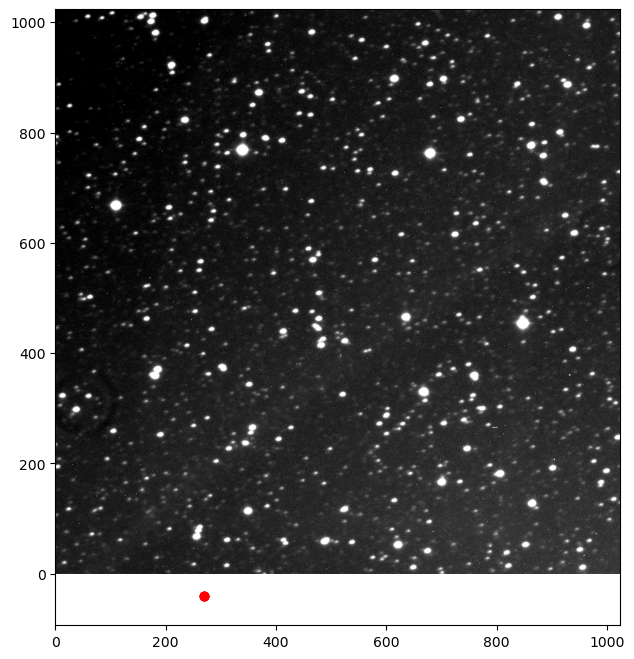

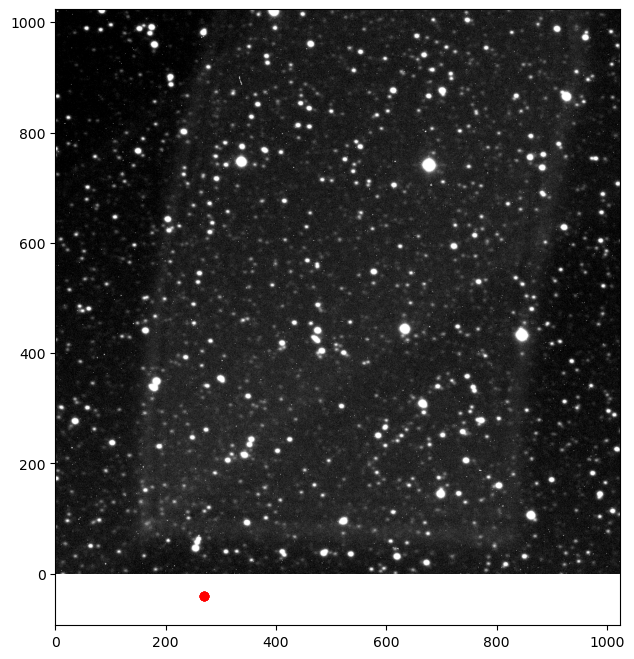

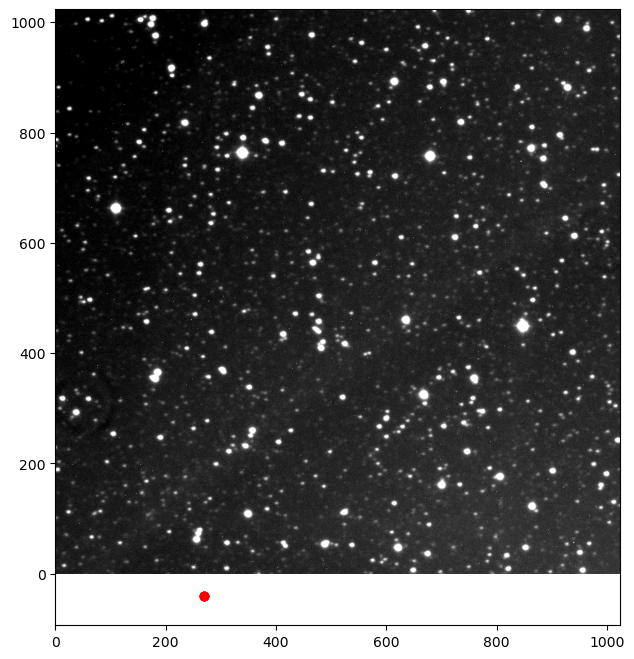

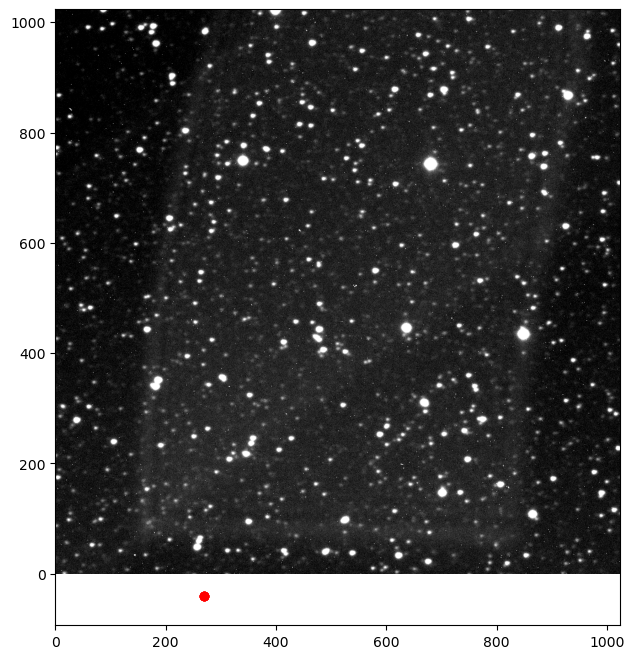

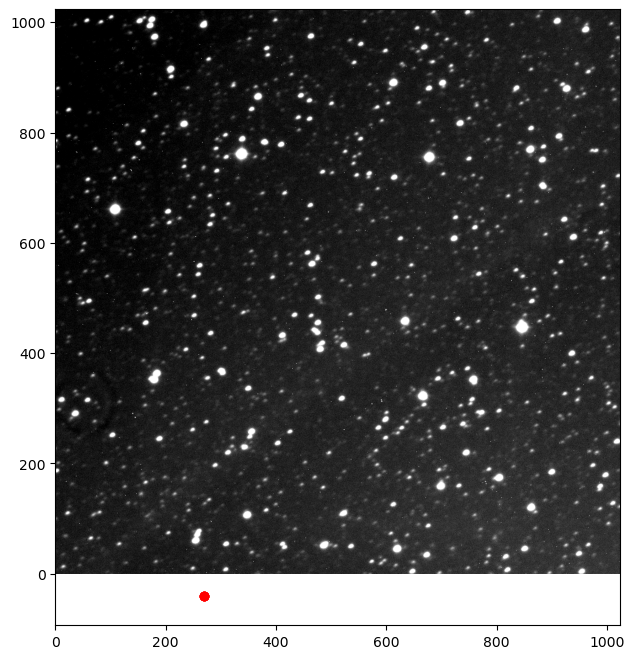

...

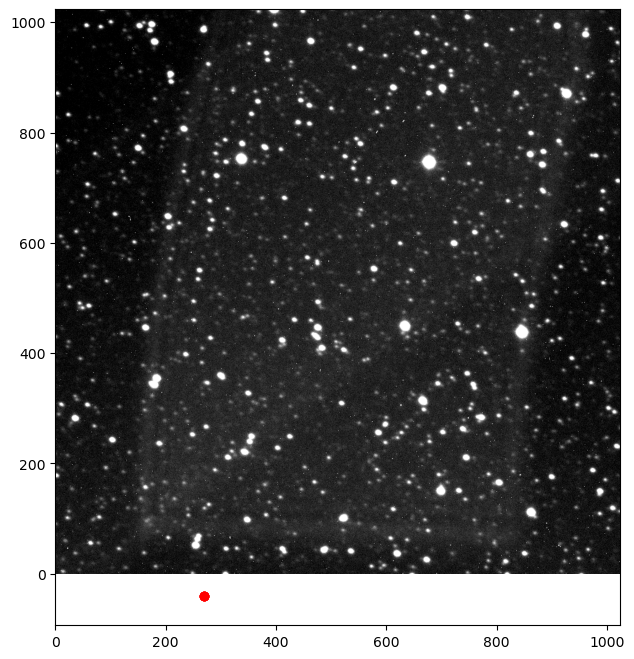

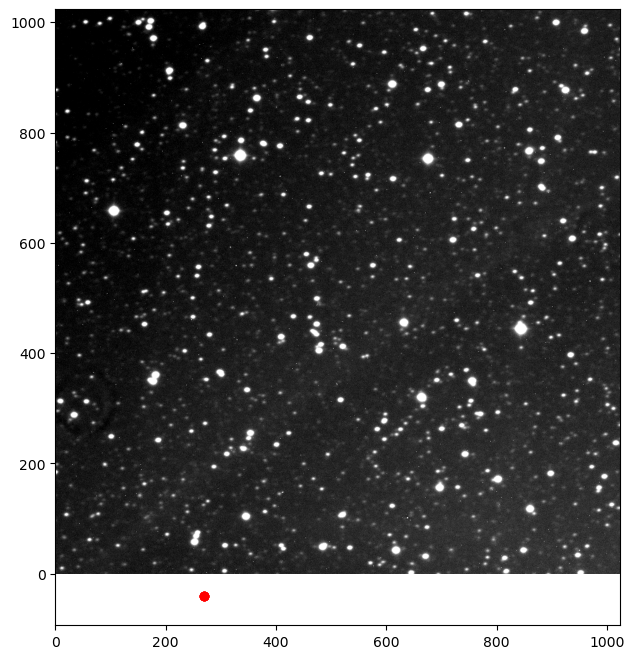

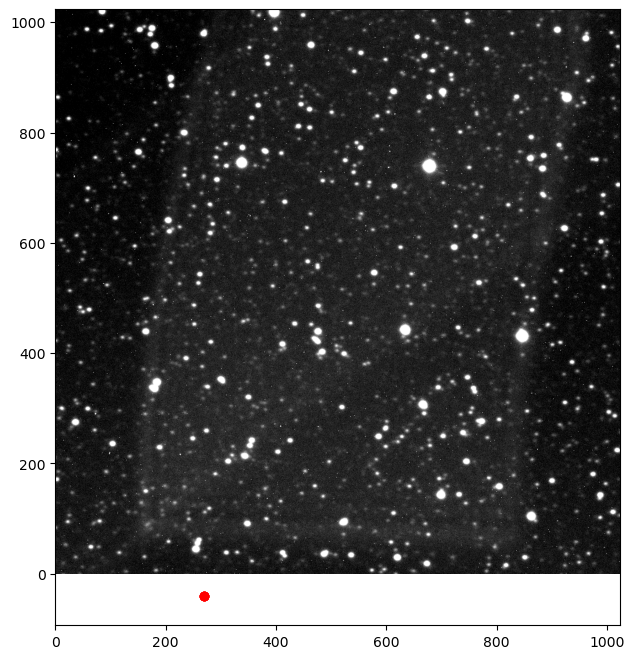

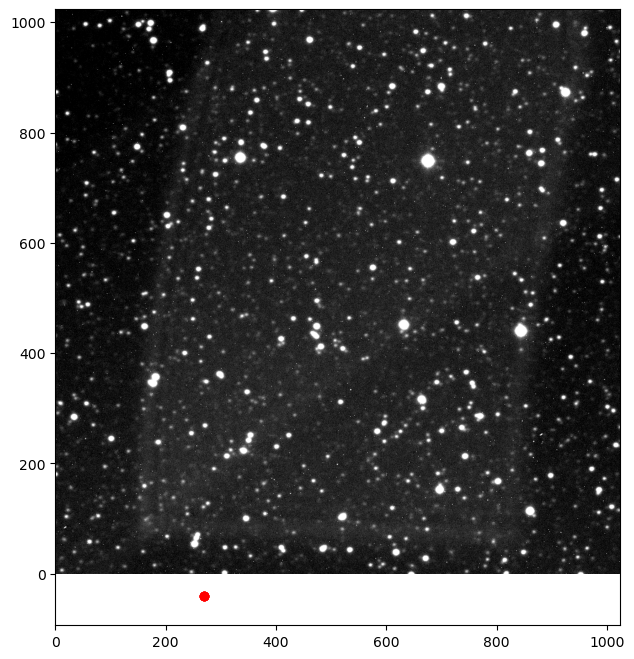

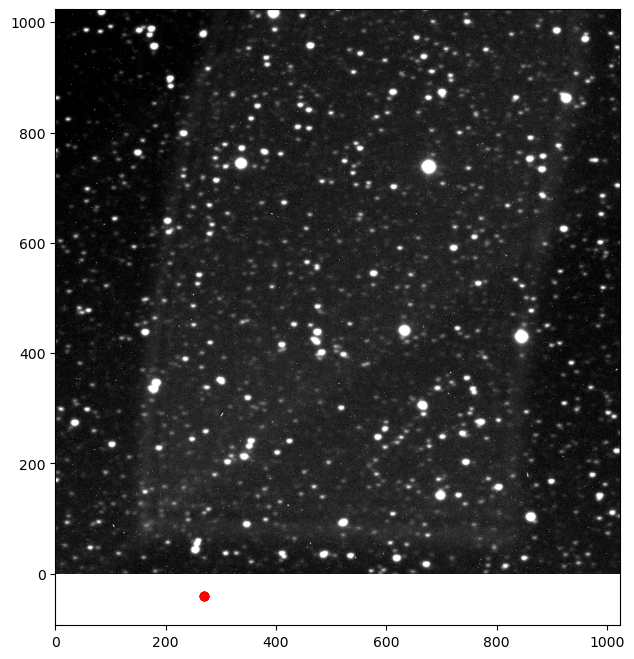

In [143]:

output_coo = ref_coo_path
ref_stars = np.loadtxt(output_coo)
for i in range(len(image_files)):
    image_path = image_dir+image_files[i]
    plot_ref_stars(image_path, ref_stars)

In [142]:
ref_stars

array([[269.58108945, -39.51707395],
       [269.72181321, -39.52907949],
       [269.69969398, -39.46555678],
       [269.74175026, -39.54918278],
       [269.76063144, -39.55070528]])

In [40]:
import requests
from astropy.io.votable import parse
import io
import numpy as np
from astropy.coordinates import SkyCoord
import astropy.units as u

# Coordenadas de tu microlente
ra_center = 269.7132083333333   # grados
dec_center = -39.59733333333334

# Radio aproximado mitad FOV HSH (~4.8 arcmin)
search_radius_arcmin = 5.0

mag_limits = [20, 13, 16, 17, 18]

for mag_max in mag_limits:
    # URL corregida (nota: phot_g_mean_mag<{mag_max} y >13)
    url = (f"http://vizier.cds.unistra.fr/viz-bin/votable?"
           f"-source=I/355/gaiadr3"
           f"&-c={ra_center},{dec_center}"
           f"&-c.rm={search_radius_arcmin}"
           f"&-out=RA_ICRS,DI_errCRS,phot_g_mean_mag"
           f"&-out.max=100"
           f"&phot_g_mean_mag<{mag_max}"
           f"&phot_g_mean_mag>13")
    
    print(f"\nProbando mag < {mag_max}")
    print(url)
    
    try:
        r = requests.get(url, timeout=30)
        r.raise_for_status()
        vot = parse(io.BytesIO(r.content))
        table = vot.get_first_table().to_table()
        print(f"Estrellas encontradas: {len(table)}")
        if len(table) > 0:
            print(table[:5])  # muestra las 5 más brillantes
            break
    except Exception as e:
        print(f"Error: {e}")


Probando mag < 20
http://vizier.cds.unistra.fr/viz-bin/votable?-source=I/355/gaiadr3&-c=269.7132083333333,-39.59733333333334&-c.rm=5.0&-out=RA_ICRS,DE_ICRS,phot_g_mean_mag&-out.max=100&phot_g_mean_mag<20&phot_g_mean_mag>13
Error: No table found in VOTABLE file.

Probando mag < 13
http://vizier.cds.unistra.fr/viz-bin/votable?-source=I/355/gaiadr3&-c=269.7132083333333,-39.59733333333334&-c.rm=5.0&-out=RA_ICRS,DE_ICRS,phot_g_mean_mag&-out.max=100&phot_g_mean_mag<13&phot_g_mean_mag>13
Error: No table found in VOTABLE file.

Probando mag < 16
http://vizier.cds.unistra.fr/viz-bin/votable?-source=I/355/gaiadr3&-c=269.7132083333333,-39.59733333333334&-c.rm=5.0&-out=RA_ICRS,DE_ICRS,phot_g_mean_mag&-out.max=100&phot_g_mean_mag<16&phot_g_mean_mag>13
Error: No table found in VOTABLE file.

Probando mag < 17
http://vizier.cds.unistra.fr/viz-bin/votable?-source=I/355/gaiadr3&-c=269.7132083333333,-39.59733333333334&-c.rm=5.0&-out=RA_ICRS,DE_ICRS,phot_g_mean_mag&-out.max=100&phot_g_mean_mag<17&phot_g

In [36]:
import requests

# =========================
# Región del cielo
# =========================

ra_center = 269.54      # grados
dec_center = -19.98    # grados
radius = 0.2           # grados

# =========================
# Surveys a descargar
# =========================

surveys = {
    "gaia_dr3": {
        "table": "gaiadr3.gaia_source",
        "ra": "ra",
        "dec": "dec",
        "mag_cut": "phot_g_mean_mag < 16",
        "columns": "sourcI_errd, ra, dec, phot_g_mean_mag"
    },
    "2mass": {
        "table": "\"II/246/out\"",
        "ra": "raj2000",
        "dec": "dej2000",
        "mag_cut": "jmag < 14",
        "columns": "raj2000, dej2000, jmag, hmag, kmag"
    },
    "apass": {
        "table": "\"II/336/apass9\"",
        "ra": "raj2000",
        "dec": "dej2000",
        "mag_cut": "Vmag < 15",
        "columns": "raj2000, dej2000, Vmag, Bmag, gmag, rmag, imag"
    }
}

# =========================
# TAP endpoint correcto
# =========================

tap_url = "https://tap.cds.unistra.fr/TAP/sync"
tap_url = "https://tapvizier.cds.unistra.fr/TAP/sync"
tap_url = "http://tapvizier.u-strasbg.fr/TAP/sync"
tap_url = "https://gea.esac.esa.int/tap-server/tap/sync"



# =========================
# Loop sobre surveys
# =========================

for name, s in surveys.items():

    query = f"""
    SELECT {s['columns']}
    FROM {s['table']}
    WHERE
        1 = CONTAINS(
            POINT('ICRS', {s['ra']}, {s['dec']}),
            CIRCLE('ICRS', {ra_center}, {dec_center}, {radius})
        )
        AND {s['mag_cut']}
    """

    payload = {
        "request": "doQuery",
        "lang": "ADQL",
        "format": "csv",
        "query": query
    }

    response = requests.post(tap_url, data=payload)

    if response.status_code == 200:
        filename = f"{name}_stars.csv"
        with open(filename, "w") as f:
            f.write(response.text)
        print(f"{name}: descargado correctamente")
    else:
        print(f"{name}: ERROR {response.status_code}")


gaia_dr3: descargado correctamente
2mass: ERROR 400
apass: ERROR 400


In [37]:
import requests

url = "http://tapvizier.u-strasbg.fr/TAP/sync"

r = requests.get(url, timeout=10)
print(r.status_code)


404


In [28]:
from astroquery.vizier import Vizier
from astropy.coordinates import SkyCoord
import astropy.units as u

Vizier.ROW_LIMIT = -1

coord = SkyCoord(ra=269.54*u.deg, dec=-19.98*u.deg)
radius = 0.2 * u.deg

result = Vizier.query_region(
    coord,
    radius=radius,
    catalog="II/246"   # 2MASS
)

#"II/246" → 2MASS
#"II/336" → APASS
#"I/350" → Gaia DR3 (VizieR mirror)

table = result[0]
table.write("2mass_stars.csv", format="csv", overwrite=True)


ModuleNotFoundError: No module named 'astroquery'

Leídas 8 estrellas de referencia de OGLE-2025-BLG-0397_refpsf.coo


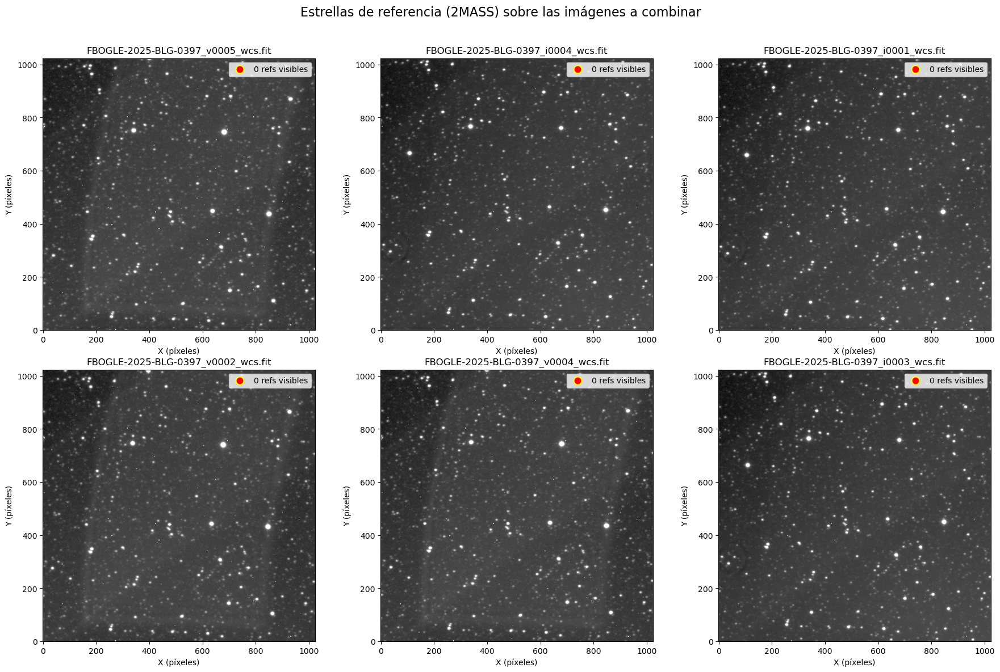

In [46]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import simple_norm
from pathlib import Path

# ==== CONFIGURACIÓN ====
# Ruta al archivo .coo generado por comb.py (puede ser el local o el global)
#coo_file = "OGLE-2025-BLG-0397_refpsf.coo"          # local (en la carpeta de la noche)
coo_file = "data/objetos/OGLE-2025-BLG-0397/OGLE-2025-BLG-0397_refpsf.coo"  # global

# Lista de las imágenes que quieres combinar (cámbiala si tienes otras)
image_files = [im for im in os.listdir("data/20250822bis/OGLE-2025-BLG-0397") if im.startswith("FB")]
# ==== LEER EL .COO (RA Dec mag) ====
refs = np.loadtxt(coo_file)          # 3 columnas: RA, Dec, mag
ra_refs  = refs[:, 0]
dec_refs = refs[:, 1]

print(f"Leídas {len(ra_refs)} estrellas de referencia de {Path(coo_file).name}")

# ==== PLOTEAR ====
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for idx, img_file in enumerate(image_files[:6]):
    ax = axes[idx]
    
    # Abrir imagen
    with fits.open("data/20250822bis/OGLE-2025-BLG-0397/"+img_file) as hdul:
        data   = hdul[0].data
        header = hdul[0].header
        wcs    = WCS(header)
    
    # Normalización para visualización
    norm = simple_norm(data, 'sqrt', percent=99.5)
    ax.imshow(data, cmap='gray', norm=norm, origin='lower')
    
    # Convertir RA/Dec de refs a píxeles en esta imagen
    x_pix, y_pix = wcs.world_to_pixel_values(ra_refs, dec_refs)
    
    # Filtrar las que caen dentro del CCD
    ny, nx = data.shape
    inside = (x_pix >= 0) & (x_pix < nx) & (y_pix >= 0) & (y_pix < ny)
    
    ax.scatter(x_pix[inside], y_pix[inside],
               c='red', s=100, marker='o', edgecolor='yellow', linewidth=1.5,
               label=f'{inside.sum()} refs visibles')
    
    ax.set_title(Path(img_file).name, fontsize=12)
    ax.set_xlabel('X (píxeles)')
    ax.set_ylabel('Y (píxeles)')
    ax.legend(loc='upper right')

plt.suptitle("Estrellas de referencia (2MASS) sobre las imágenes a combinar", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Imágenes encontradas: 6

Probando catálogo II/246/out (mag < 16)...
¡Éxito! 8 refs encontradas en II/246/out


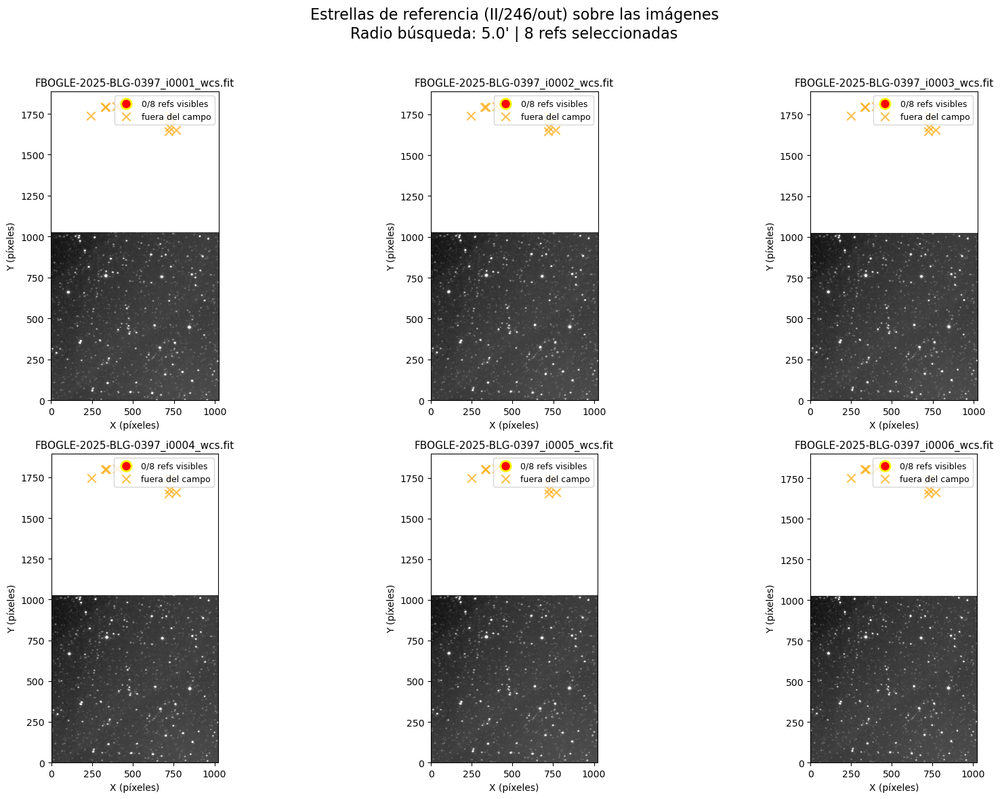


Archivo 'test_refpsf.coo' guardado para probar en comb.py


In [49]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import simple_norm
from astropy.coordinates import SkyCoord
import astropy.units as u
from astroquery.vizier import Vizier
import os

# ========================
# CONFIGURACIÓN
# ========================
# Coordenadas del centro del campo (ajusta si es necesario)
ra_center  = 269.7132083333333   # grados
dec_center = -39.59733333333334

# Radio de búsqueda: mitad del FOV HSH (~9.5' → ~5')
search_radius_arcmin = 5.0

# Directorio con las imágenes
img_dir = "data/20250822bis/OGLE-2025-BLG-0397"

# Lista de imágenes (las 6 que quieres combinar)
image_files = [f for f in os.listdir(img_dir) if f.startswith("FB") and f.endswith("_wcs.fit")]
image_files = sorted(image_files)[:6]  # por si hay más
print(f"Imágenes encontradas: {len(image_files)}")

# ========================
# QUERY A VIZIER (2MASS → APASS → Gaia DR3)
# ========================
Vizier.ROW_LIMIT = -1  # sin límite

coord = SkyCoord(ra=ra_center*u.deg, dec=dec_center*u.deg)
radius = search_radius_arcmin * u.arcmin

catalogs = [
    "II/246/out",      # 2MASS (mejor para sur)
    "II/336/apass9",   # APASS (óptico)
    "I/355/gaiadr3"    # Gaia DR3 (fallback)
]
mag_cols = ["Jmag", "r_mag", "phot_g_mean_mag"]
min_mag = 13
max_mag = 16  # primero intenta brillantes

refs_ra = []
refs_dec = []
refs_mag = []
catalog_used = ""

for cat, mag_col in zip(catalogs, mag_cols):
    print(f"\nProbando catálogo {cat} (mag < {max_mag})...")
    try:
        result = Vizier(columns=['_RAJ2000', '_DEJ2000', mag_col],
                        column_filters={mag_col: f'<{max_mag}', mag_col: f'>{min_mag}'}).query_region(
            coord, radius=radius, catalog=cat)
        if result and len(result[0]) > 0:
            table = result[0]
            ra_col  = '_RAJ2000' if '_RAJ2000' in table.colnames else 'RA_ICRS'
            dec_col = '_DEJ2000' if '_DEJ2000' in table.colnames else 'DI_errCRS'
            
            ras  = table[ra_col].data
            decs = table[dec_col].data
            mags = table[mag_col].data
            
            # Excluir muy cerca del centro (evita blending con la microlente)
            center = SkyCoord(ra_center, dec_center, unit='deg')
            coords = SkyCoord(ras, decs, unit='deg')
            sep_center = center.separation(coords).arcmin
            mask = sep_center > 0.5
            ras, decs, mags = ras[mask], decs[mask], mags[mask]
            
            # Ordenar por brillo y tomar hasta 8
            idx = np.argsort(mags)
            selected = 8
            refs_ra   = ras[idx][:selected]
            refs_dec  = decs[idx][:selected]
            refs_mag  = mags[idx][:selected]
            
            catalog_used = cat
            print(f"¡Éxito! {len(refs_ra)} refs encontradas en {cat}")
            break
    except Exception as e:
        print(f"  Error en {cat}: {e}")

if len(refs_ra) == 0:
    raise RuntimeError("No se encontraron refs en ningún catálogo. Usa selección manual.")

# ========================
# PLOTEAR SOBRE LAS IMÁGENES
# ========================
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for idx, img_file in enumerate(image_files):
    ax = axes[idx]
    path = os.path.join(img_dir, img_file)
    
    with fits.open(path) as hdul:
        data   = hdul[0].data
        header = hdul[0].header
        w      = WCS(header)
    
    norm = simple_norm(data, 'sqrt', percent=99.5)
    ax.imshow(data, cmap='gray', norm=norm, origin='lower')
    
    # Convertir refs a píxeles
    x_pix, y_pix = w.world_to_pixel_values(refs_ra, refs_dec)
    
    ny, nx = data.shape
    inside = (x_pix >= 0) & (x_pix < nx) & (y_pix >= 0) & (y_pix < ny)
    
    ax.scatter(x_pix[inside], y_pix[inside],
               c='red', s=120, marker='o', edgecolor='yellow', linewidth=2,
               label=f'{inside.sum()}/{len(refs_ra)} refs visibles')
    
    ax.scatter(x_pix[~inside], y_pix[~inside],
               c='orange', s=80, marker='x', alpha=0.7,
               label='fuera del campo')
    
    ax.set_title(img_file, fontsize=11)
    ax.set_xlabel('X (píxeles)')
    ax.set_ylabel('Y (píxeles)')
    ax.legend(loc='upper right', fontsize=9)

plt.suptitle(f"Estrellas de referencia ({catalog_used}) sobre las imágenes\n"
             f"Radio búsqueda: {search_radius_arcmin}' | {len(refs_ra)} refs seleccionadas",
             fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Opcional: guardar el .coo para usar en comb.py
np.savetxt("test_refpsf.coo", np.column_stack((refs_ra, refs_dec, refs_mag)),
           fmt="%.6f %.6f %.3f")
print("\nArchivo 'test_refpsf.coo' guardado para probar en comb.py")

Objetos disponibles:
               objeto      ra_deg    dec_deg       ra_ecu      dec_ecu
0  OGLE-2025-BLG-0451  269.540958 -19.978000  17:58:09.83  -19:58:40.8
1  OGLE-2025-BLG-0397  269.713208 -39.597333  17:58:51.17  -39:35:50.4



Ingresa el número o nombre del objeto (ej: 2 o OGLE-2025-BLG-0397):  0



Objeto seleccionado: OGLE-2025-BLG-0451
RA = 269.540958 deg, Dec = -19.978000 deg
Imágenes encontradas (6): ['FBOGLE-2025-BLG-0451_i0001_wcs.fit', 'FBOGLE-2025-BLG-0451_i0002_wcs.fit', 'FBOGLE-2025-BLG-0451_i0003_wcs.fit', 'FBOGLE-2025-BLG-0451_v0002_wcs.fit', 'FBOGLE-2025-BLG-0451_v0003_wcs.fit', 'FBOGLE-2025-BLG-0451_v0004_wcs.fit']

Probando catálogo II/246/out...
¡Éxito! 8 refs encontradas en II/246/out
Usando 8 refs de II/246/out


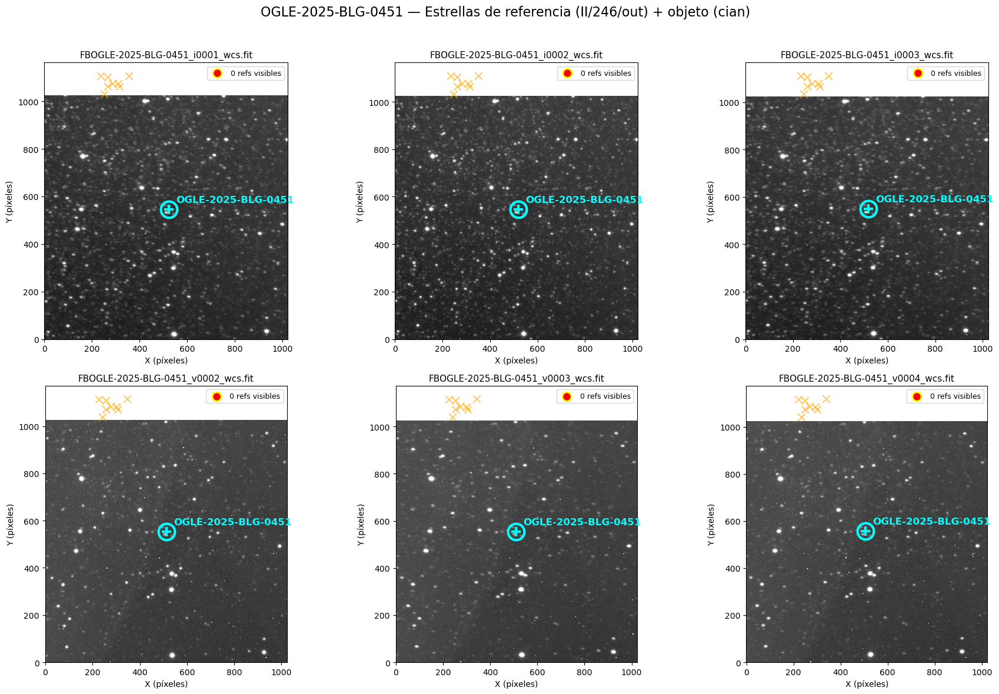


Archivo OGLE-2025-BLG-0451_refpsf_auto.coo guardado. Puedes copiarlo a la carpeta global para probar en comb.py


In [71]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import simple_norm
from astropy.coordinates import SkyCoord
import astropy.units as u
from astroquery.vizier import Vizier
import pandas as pd
import os

# ========================
# 1. LEER LISTA DE OBJETOS
# ========================
csv_file = "objetos.csv"  # ajusta si está en otra carpeta
df = pd.read_csv(csv_file)

print("Objetos disponibles:")
print(df)
# ========================
# 2. ELEGIR OBJETO
# ========================
choice = input("\nIngresa el número o nombre del objeto (ej: 2 o OGLE-2025-BLG-0397): ").strip()

if choice.isdigit():
    idx = int(choice) 
    obj_name = df.loc[idx, 'objeto']
else:
    idx = df[df['objeto'] == choice].index[0]
    obj_name = choice

ra_center  = df.loc[idx, 'ra_deg']
dec_center = df.loc[idx, 'dec_deg']

print(f"\nObjeto seleccionado: {obj_name}")
print(f"RA = {ra_center:.6f} deg, Dec = {dec_center:.6f} deg")

# ========================
# 3. CONFIGURACIÓN DE CARPETA DE IMÁGENES
# ========================
# Asume que las imágenes están en una carpeta con el nombre del objeto dentro de data/
base_dir = "data/20250822bis"
img_dir = os.path.join(base_dir, obj_name)

if not os.path.exists(img_dir):
    raise FileNotFoundError(f"No se encontró la carpeta {img_dir}")

image_files = [f for f in os.listdir(img_dir) if f.startswith("FB") and f.endswith("_wcs.fit")]
image_files = sorted(image_files)[:6]  # máximo 6 para el plot 2x3

print(f"Imágenes encontradas ({len(image_files)}): {image_files}")

# ========================
# 4. QUERY AUTOMÁTICO A VIZIER
# ========================
Vizier.ROW_LIMIT = -1
coord = SkyCoord(ra=ra_center*u.deg, dec=dec_center*u.deg)
search_radius_arcmin = 6.0  # un poco más grande para asegurar refs

catalogs = ["II/246/out", "II/336/apass9", "I/355/gaiadr3"]  # 2MASS primero
mag_cols = ["Jmag", "r_mag", "phot_g_mean_mag"]

refs_ra = []
refs_dec = []
refs_mag = []
catalog_used = ""

for cat, mag_col in zip(catalogs, mag_cols):
    print(f"\nProbando catálogo {cat}...")
    try:
        result = Vizier(columns=['_RAJ2000', '_DEJ2000', mag_col],
                        column_filters={mag_col: '<16', mag_col: '>13'}).query_region(
            coord, radius=search_radius_arcmin*u.arcmin, catalog=cat)
        if result and len(result[0]) > 0:
            table = result[0]
            ra_col  = '_RAJ2000' if '_RAJ2000' in table.colnames else 'RA_ICRS'
            dec_col = '_DEJ2000' if '_DEJ2000' in table.colnames else 'DI_errCRS'
            
            ras  = table[ra_col].data
            decs = table[dec_col].data
            mags = table[mag_col].data
            
            # Excluir muy cerca del centro
            center = SkyCoord(ra_center, dec_center, unit='deg')
            coords = SkyCoord(ras, decs, unit='deg')
            sep = center.separation(coords).arcmin
            mask = sep > 0.5
            ras, decs, mags = ras[mask], decs[mask], mags[mask]
            
            idx = np.argsort(mags)
            selected = min(8, len(ras))
            refs_ra   = ras[idx][:selected]
            refs_dec  = decs[idx][:selected]
            refs_mag  = mags[idx][:selected]
            
            catalog_used = cat
            print(f"¡Éxito! {len(refs_ra)} refs encontradas en {cat}")
            break
    except Exception as e:
        print(f"  Error: {e}")

if len(refs_ra) == 0:
    print("No se encontraron refs automáticas buenas. Usa selección manual en DS9.")
else:
    print(f"Usando {len(refs_ra)} refs de {catalog_used}")

# ========================
# 5. PLOTEAR IMÁGENES CON REFS Y OBJETO
# ========================
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for idx, img_file in enumerate(image_files):
    ax = axes[idx]
    path = os.path.join(img_dir, img_file)
    
    with fits.open(path) as hdul:
        data   = hdul[0].data
        header = hdul[0].header
        w      = WCS(header)
    
    norm = simple_norm(data, 'sqrt', percent=99.5)
    ax.imshow(data, cmap='gray', norm=norm, origin='lower')
    
    if len(refs_ra) > 0:
        x_ref, y_ref = w.world_to_pixel_values(refs_ra, refs_dec)
        ny, nx = data.shape
        inside = (x_ref >= 0) & (x_ref < nx) & (y_ref >= 0) & (y_ref < ny)
        
        ax.scatter(x_ref[inside], y_ref[inside],
                   c='red', s=120, edgecolor='yellow', linewidth=2,
                   label=f'{inside.sum()} refs visibles')
        ax.scatter(x_ref[~inside], y_ref[~inside],
                   c='orange', s=80, marker='x', alpha=0.6)

    # Marcar el objeto (microlente) en azul
    x_obj, y_obj = w.world_to_pixel_values(ra_center, dec_center)
    #if 0 <= x_obj < nx and 0 <= y_obj < ny:
    ax.plot(x_obj, y_obj, 'o', color='cyan', ms=20, fillstyle='none', mew=3)
    ax.plot(x_obj, y_obj, '+', color='cyan', ms=12, mew=3)
    ax.text(x_obj+30, y_obj+30, obj_name, color='cyan', fontsize=12, fontweight='bold')

    ax.set_title(img_file, fontsize=11)
    ax.set_xlabel('X (píxeles)')
    ax.set_ylabel('Y (píxeles)')
    if len(refs_ra) > 0:
        ax.legend(loc='upper right', fontsize=9)

plt.suptitle(f"{obj_name} — Estrellas de referencia ({catalog_used if catalog_used else 'ninguna'}) + objeto (cian)",
             fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# ========================
# 6. GUARDAR .COO PARA USAR EN comb.py (opcional)
# ========================
if len(refs_ra) > 0:
    coo_output = f"{obj_name}_refpsf_auto.coo"
    np.savetxt(coo_output, np.column_stack((refs_ra, refs_dec, refs_mag)),
               fmt="%.6f %.6f %.3f")
    print(f"\nArchivo {coo_output} guardado. Puedes copiarlo a la carpeta global para probar en comb.py")

Objetos disponibles:
            objeto     ra_deg    dec_deg
OGLE-2025-BLG-0451 269.540958 -19.978000
OGLE-2025-BLG-0397 269.713208 -39.597333



Ingresa el número o nombre del objeto (ej: 1 o OGLE-2025-BLG-0451):  0



Objeto seleccionado: OGLE-2025-BLG-0451
RA = 269.540958°, Dec = -19.978000°
Imágenes encontradas: 6
FOV estimado: ~9.6' (radio usado para búsqueda)

Buscando en II/246/out (mag 13–16)...
¡Éxito! 50 refs encontradas en II/246/out
Usando 50 refs de II/246/out


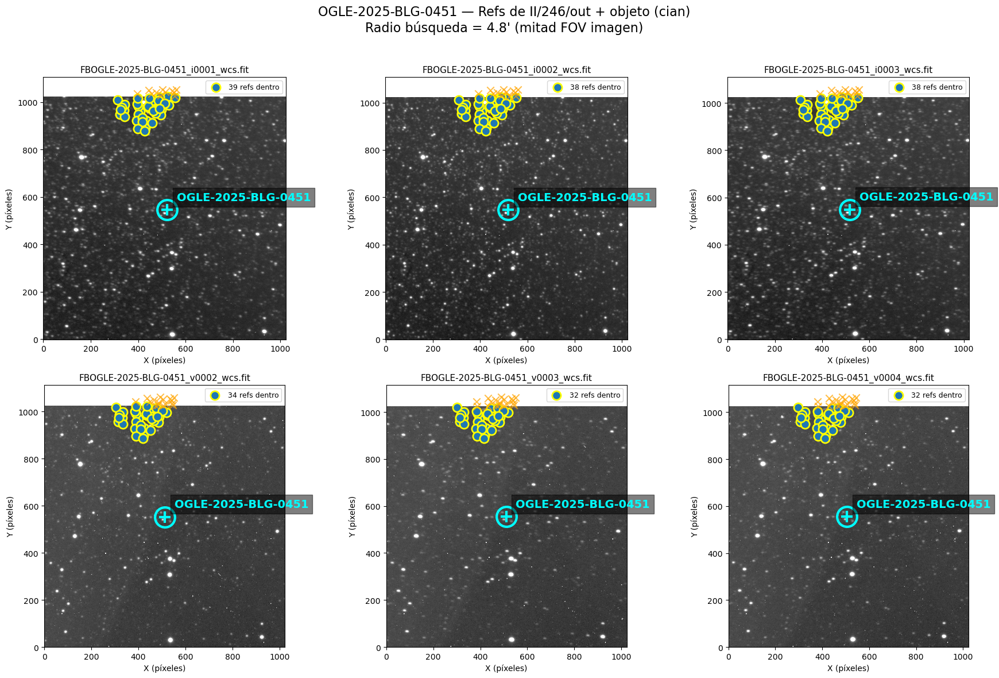


Archivo OGLE-2025-BLG-0451_refpsf_auto.coo guardado.
Cópialo a la carpeta global para usar en comb.py:
cp OGLE-2025-BLG-0451_refpsf_auto.coo ../../objetos/OGLE-2025-BLG-0451/OGLE-2025-BLG-0451_refpsf.coo


In [85]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import simple_norm
from astropy.coordinates import SkyCoord
import astropy.units as u
from astroquery.vizier import Vizier
import pandas as pd
import os

# ========================
# 1. LEER LISTA DE OBJETOS
# ========================
csv_file = "objetos.csv"
df = pd.read_csv(csv_file)

print("Objetos disponibles:")
print(df[['objeto', 'ra_deg', 'dec_deg']].to_string(index=False))

# ========================
# 2. ELEGIR OBJETO
# ========================
choice = input("\nIngresa el número o nombre del objeto (ej: 1 o OGLE-2025-BLG-0451): ").strip()

if choice.isdigit():
    idx = int(choice)# porque el CSV empieza en 1
else:
    idx = df[df['objeto'] == choice].index[0]

obj_name   = df.loc[idx, 'objeto']
ra_center  = df.loc[idx, 'ra_deg']
dec_center = df.loc[idx, 'dec_deg']

print(f"\nObjeto seleccionado: {obj_name}")
print(f"RA = {ra_center:.6f}°, Dec = {dec_center:.6f}°")

# ========================
# 3. CARPETA DE IMÁGENES
# ========================
base_dir = "data/20250822bis"  # ajusta si es diferente
img_dir = os.path.join(base_dir, obj_name)

if not os.path.exists(img_dir):
    raise FileNotFoundError(f"No existe la carpeta: {img_dir}")

image_files = sorted([f for f in os.listdir(img_dir) 
                     if f.startswith("FB") and f.endswith("_wcs.fit")])
image_files = image_files[:6]  # máximo 6 para el plot

print(f"Imágenes encontradas: {len(image_files)}")

# ========================
# 4. CALCULAR RADIO = TAMAÑO DE UNA IMAGEN
# ========================
# Abrimos la primera imagen para medir el FOV real
first_img = os.path.join(img_dir, image_files[0])
with fits.open(first_img) as hdul:
    header = hdul[0].header
    w = WCS(header)
    nx, ny = hdul[0].data.shape

# Esquinas del CCD en píxeles
corners = np.array([[0, 0], [nx, 0], [0, ny], [nx, ny]])
ra_corners, dec_corners = w.pixel_to_world_values(corners[:,0], corners[:,1])

# Tamaño aproximado del FOV en arcmin (máximo lado)
width_arcmin  = np.max(np.abs(np.diff(ra_corners))) * 60 * np.cos(np.radians(np.mean(dec_corners)))
height_arcmin = np.max(np.abs(np.diff(dec_corners))) * 60
search_radius_arcmin = max(width_arcmin, height_arcmin) / 2  # radio = mitad del FOV

print(f"FOV estimado: ~{2*search_radius_arcmin:.1f}' (radio usado para búsqueda)")

# ========================
# 5. QUERY A VIZIER (prioridad 2MASS → APASS → Gaia)
# ========================
Vizier.ROW_LIMIT = -1
coord = SkyCoord(ra=ra_center*u.deg, dec=dec_center*u.deg)
radius = search_radius_arcmin * u.arcmin

catalogs = ["II/246/out", "II/336/apass9", "I/355/gaiadr3"]
mag_cols = ["Jmag", "r_mag", "phot_g_mean_mag"]

refs_ra = refs_dec = refs_mag = []
catalog_used = ""

for cat, mag_col in zip(catalogs, mag_cols):
    print(f"\nBuscando en {cat} (mag 13–16)...")
    try:
        result = Vizier(columns=['_RAJ2000', '_DEJ2000', mag_col],
                        column_filters={mag_col: '<16', mag_col: '>13'}).query_region(
            coord, radius=radius, catalog=cat)
        if result and len(result[0]) > 0:
            table = result[0]
            ra_col  = '_RAJ2000' if '_RAJ2000' in table.colnames else 'RA_ICRS'
            dec_col = '_DEJ2000' if '_DEJ2000' in table.colnames else 'DI_errCRS'
            
            ras  = table[ra_col].data.data
            decs = table[dec_col].data.data
            mags = table[mag_col].data.data
            
            # Excluir muy cerca del objeto
            center = SkyCoord(ra_center, dec_center, unit='deg')
            sep = center.separation(SkyCoord(ras, decs, unit='deg')).arcmin
            mask = sep > 0.5
            ras, decs, mags = ras[mask], decs[mask], mags[mask]
            
            # Seleccionar las 8 más brillantes
            idx = np.argsort(mags)
            n = min(100, len(idx))
            refs_ra   = ras[idx][:n]
            refs_dec  = decs[idx][:n]
            refs_mag  = mags[idx][:n]
            
            catalog_used = cat
            print(f"¡Éxito! {n} refs encontradas en {cat}")
            break
    except Exception as e:
        print(f"  Error: {e}")

if len(refs_ra) == 0:
    print("No se encontraron refs automáticas en el FOV. Usa selección manual en DS9.")
else:
    print(f"Usando {len(refs_ra)} refs de {catalog_used}")

# ========================
# 6. PLOTEAR
# ========================
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for i, img_file in enumerate(image_files):
    ax = axes[i]
    path = os.path.join(img_dir, img_file)
    
    with fits.open(path) as hdul:
        data = hdul[0].data
        w = WCS(hdul[0].header)
    
    norm = simple_norm(data, 'sqrt', percent=99.5)
    ax.imshow(data, cmap='gray', norm=norm, origin='lower')
    
    # Refs
    if len(refs_ra) > 0:
        x, y = w.world_to_pixel_values(refs_ra, refs_dec)
        ny, nx = data.shape
        inside = (x >= 0) & (x < nx) & (y >= 0) & (y < ny)
        
        ax.scatter(x[inside], y[inside], s=120, edgecolor='yellow', lw=2,
                   label=f'{inside.sum()} refs dentro')
        ax.scatter(x[~inside], y[~inside], c='orange', s=80, marker='x', alpha=0.7)
    
    # Objeto
    x_obj, y_obj = w.world_to_pixel_values(ra_center, dec_center)
    ax.plot(x_obj, y_obj, 'o', color='cyan', ms=25, fillstyle='none', mew=3)
    ax.plot(x_obj, y_obj, '+', color='cyan', ms=15, mew=3)
    ax.text(x_obj+40, y_obj+40, obj_name, color='cyan', fontsize=14, fontweight='bold',
            bbox=dict(facecolor='black', alpha=0.5, pad=5))
    
    ax.set_title(img_file, fontsize=11)
    ax.set_xlabel("X (píxeles)")
    ax.set_ylabel("Y (píxeles)")
    if len(refs_ra) > 0:
        ax.legend(loc='upper right', fontsize=9)

plt.suptitle(f"{obj_name} — Refs de {catalog_used or 'ninguno'} + objeto (cian)\n"
             f"Radio búsqueda = {search_radius_arcmin:.1f}' (mitad FOV imagen)",
             fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# ========================
# 7. GUARDAR .COO
# ========================
if len(refs_ra) > 0:
    coo_name = f"{obj_name}_refpsf_auto.coo"
    np.savetxt(coo_name, np.column_stack((refs_ra, refs_dec, refs_mag)),
               fmt="%.6f %.6f %.3f")
    print(f"\nArchivo {coo_name} guardado.")
    print("Cópialo a la carpeta global para usar en comb.py:")
    print(f"cp {coo_name} ../../objetos/{obj_name}/{obj_name}_refpsf.coo")

Objetos disponibles:
               objeto      ra_deg    dec_deg
0  OGLE-2025-BLG-0451  269.540958 -19.978000
1  OGLE-2025-BLG-0397  269.713208 -39.597333



Ingresa número o nombre del objeto:  0



Seleccionado: OGLE-2025-BLG-0451 | RA=269.540958° Dec=-19.978000°
Imágenes encontradas: 6
FOV diagonal: 13.5' → Radio búsqueda: 4.0'

Buscando en ATLAS-REFCAT2...
  → 6 refs


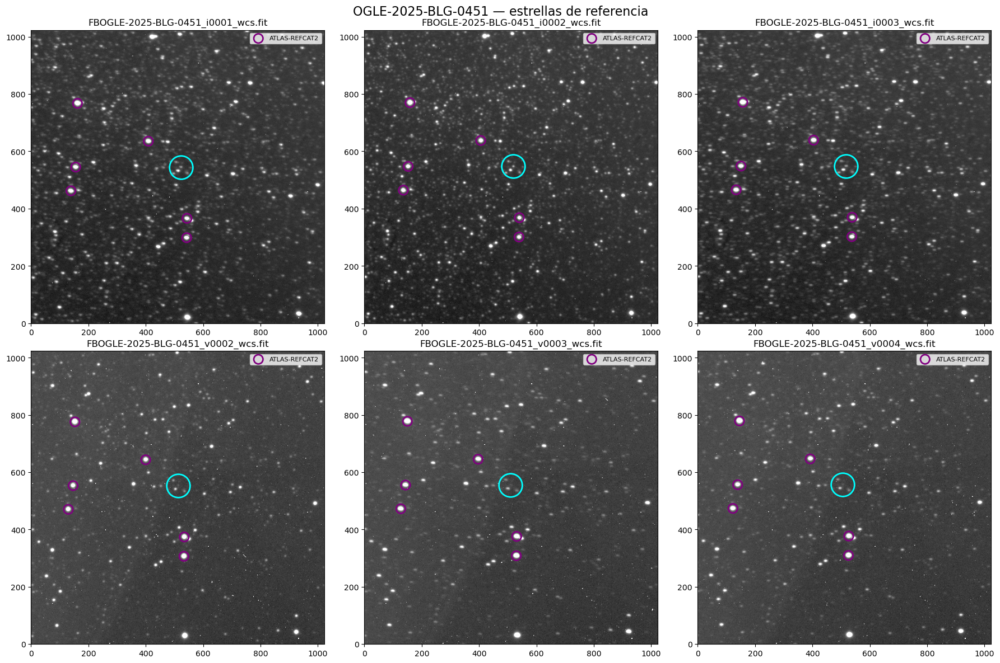


Archivo .coo generado correctamente.


In [217]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import simple_norm
from astropy.coordinates import SkyCoord, search_around_sky
import astropy.units as u
from astroquery.vizier import Vizier
import pandas as pd
import os

# ========================
# 1. LEER OBJETOS
# ========================
df = pd.read_csv("data/objetos.csv")

print("Objetos disponibles:")
print(df[['objeto', 'ra_deg', 'dec_deg']])

choice = input("\nIngresa número o nombre del objeto: ").strip()
idx = int(choice) if choice.isdigit() else df[df['objeto'] == choice].index[0]

obj_name   = df.loc[idx, 'objeto']
ra_center  = df.loc[idx, 'ra_deg']
dec_center = df.loc[idx, 'dec_deg']

print(f"\nSeleccionado: {obj_name} | RA={ra_center:.6f}° Dec={dec_center:.6f}°")

# ========================
# 2. IMÁGENES
# ========================
img_dir = f"data/20250822bis/{obj_name}"
image_files = sorted([f for f in os.listdir(img_dir)
                      if f.startswith("FB") and f.endswith("_wcs.fit")])[:6]

print(f"Imágenes encontradas: {len(image_files)}")

# ========================
# 3. FOV REAL
# ========================
with fits.open(os.path.join(img_dir, image_files[0])) as hdul:
    w_ref = WCS(hdul[0].header)
    ny, nx = hdul[0].data.shape

corners_pix = np.array([[0,0],[nx,0],[0,ny],[nx,ny]])
ra_c, dec_c = w_ref.pixel_to_world_values(corners_pix[:,0], corners_pix[:,1])
coord_corners = SkyCoord(ra_c*u.deg, dec_c*u.deg)

_, _, sep2d, _ = search_around_sky(coord_corners, coord_corners, 180*u.deg)
fov_diag_arcmin = sep2d.max().to(u.arcmin).value
search_radius_arcmin = fov_diag_arcmin * 0.3   # radio ≈ diagonal/2

print(f"FOV diagonal: {fov_diag_arcmin:.1f}' → Radio búsqueda: {search_radius_arcmin:.1f}'")

# ========================
# 4. QUERY VIZIER
# ========================

coord = SkyCoord(ra_center*u.deg, dec_center*u.deg)
radius = search_radius_arcmin * u.arcmin

catalogs = {
    # "Gaia": {
    #     "cat": "I/355/gaiadr3",
    #     "ra": "RA_ICRS",
    #     "dec": "DI_errCRS",
    #     "mag": "Gmag"
    # },
    # "2MASS": {
    #     "cat": "II/246/out",
    #     "ra": "_RAJ2000",
    #     "dec": "_DEJ2000",
    #     "mag": "Jmag"
    # },
    # "APASS": {
    #     "cat": "II/336/apass9",
    #     "ra": "_RAJ2000",
    #     "dec": "_DEJ2000",
    #     "mag": "Vmag"
    # },
    "ATLAS-REFCAT2": {
        "cat": "J/ApJ/867/105",  
        "ra": "RA_ICRS",
        "dec": "DI_errCRS",
        "mag": "rmag" 
    }
}
refs = []

for name, c in catalogs.items():
    print(f"\nBuscando en {name}...")
    try:
        v = Vizier(columns=[c["ra"], c["dec"], c["mag"]],
                   column_filters={c["mag"]: "9..12"}, row_limit=10000)
        r = v.query_region(coord, radius=radius, catalog=c["cat"])

        if not r or len(r[0]) == 0:
            print("  → vacío")
            continue

        t = r[0]
        ra  = t[c["ra"]].filled(np.nan)
        dec = t[c["dec"]].filled(np.nan)
        mag = t[c["mag"]].filled(np.nan)

        ok = ~np.isnan(ra) & ~np.isnan(dec) & ~np.isnan(mag)
        ra, dec, mag = ra[ok], dec[ok], mag[ok]

        # excluir objeto
        sep = coord.separation(SkyCoord(ra, dec)).arcmin
        mask = sep > 0.5
        ra, dec, mag = ra[mask], dec[mask], mag[mask]

        idx = np.argsort(mag)

        for i in idx:
            refs.append((ra[i], dec[i], mag[i], name))

        print(f"  → {len(idx)} refs")

    except Exception as e:
        print(f"  Error: {e}")

refs = np.array(refs, dtype=object)

if len(refs) == 0:
    raise RuntimeError("No se encontraron estrellas de referencia")

# ========================
# 5. PLOTEAR
# ========================
colors = {"Gaia": "yellow", "2MASS": "orange", "APASS": "lime", "ATLAS-REFCAT2": "purple"}

fig, axes = plt.subplots(2, 3, figsize=(18,12))
axes = axes.flatten()

for ax, img in zip(axes, image_files):

    with fits.open(os.path.join(img_dir, img)) as hdul:
        data = hdul[0].data
        w = WCS(hdul[0].header)

    ax.imshow(data, cmap="gray",
              norm=simple_norm(data, "sqrt", percent=99.5),
              origin="lower")

    for cat in np.unique(refs[:,3]):
        m = refs[:,3] == cat
        x, y = w.world_to_pixel_values(refs[m,0].astype(float),
                                       refs[m,1].astype(float))
        ax.scatter(x, y, s=140, facecolors='none',
                   edgecolors=colors[cat], lw=2, label=cat)

    xo, yo = w.world_to_pixel_values(ra_center, dec_center)
    ax.plot(xo, yo, 'o', ms=30, mew=2, color='cyan', fillstyle='none')
    xo, yo = w.world_to_pixel_values(83.6271782600547, 44.82242752645131)
    ax.plot(xo, yo, 'o', ms=30, mew=2, color='green', fillstyle='none')

    ax.set_title(img)
    ax.legend(fontsize=8)

plt.suptitle(f"{obj_name} — estrellas de referencia", fontsize=16)
plt.tight_layout()
plt.show()

# ========================
# 6. GUARDAR COO
# ========================
np.savetxt(f"{obj_name}_refpsf.coo",
           refs[:,:3].astype(float),
           fmt="%.6f %.6f %.3f")

print("\nArchivo .coo generado correctamente.")


In [195]:
83.6271782600547, 44.82242752645131, xo, yo, ra_center, dec_center

(83.6271782600547,
 44.82242752645131,
 array(nan),
 array(nan),
 np.float64(269.5409583333333),
 np.float64(-19.978))

In [183]:
refs

array([[np.float64(269.60055566659), np.float64(-20.01235985406),
        np.float64(10.479582), 'Gaia'],
       [np.float64(269.53752681915), np.float64(-19.93971702042),
        np.float64(11.293431), 'Gaia'],
       [np.float64(269.60418053276), np.float64(-19.96491561127),
        np.float64(11.395569), 'Gaia'],
       [np.float64(269.55973719488), np.float64(-19.99196540975),
        np.float64(11.447902), 'Gaia'],
       [np.float64(269.53737183537), np.float64(-19.95021490122),
        np.float64(11.529215), 'Gaia'],
       [np.float64(269.60146396671), np.float64(-19.97778630432),
        np.float64(11.608117), 'Gaia'],
       [np.float64(269.60055547), np.float64(-20.01236054),
        np.float32(10.547), 'ATLAS-REFCAT2'],
       [np.float64(269.53752678), np.float64(-19.93971536),
        np.float32(11.328), 'ATLAS-REFCAT2'],
       [np.float64(269.60417953), np.float64(-19.96491611),
        np.float32(11.477), 'ATLAS-REFCAT2'],
       [np.float64(269.53737144), np.float64(-

Objetos disponibles:
               objeto      ra_deg    dec_deg
0  OGLE-2025-BLG-0451  269.540958 -19.978000
1  OGLE-2025-BLG-0397  269.713208 -39.597333



Ingresa número o nombre del objeto:  1



Seleccionado: OGLE-2025-BLG-0397 | RA=269.713208° Dec=-39.597333°
Imágenes encontradas: 6
FOV diagonal: 13.5' → Radio búsqueda: 4.0'

Buscando en Gaia...
  → 6 refs

Buscando en 2MASS...
  → 35 refs

Buscando en APASS...
  → vacío


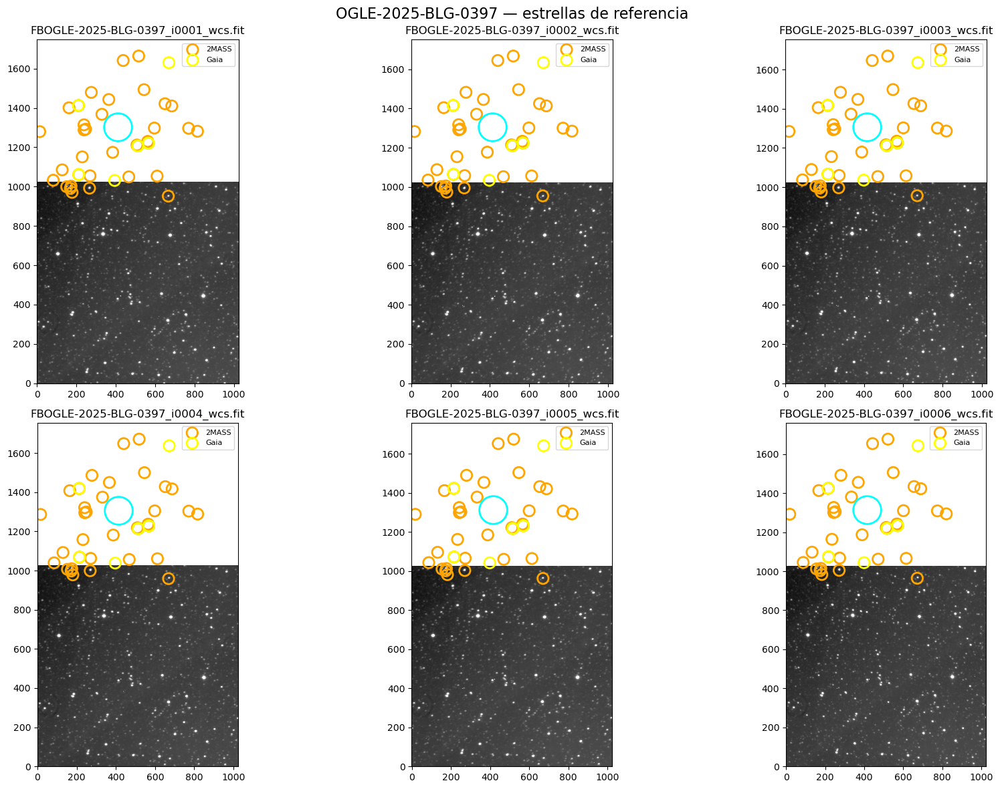


Archivo .coo generado correctamente.


In [56]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import simple_norm
from astropy.coordinates import SkyCoord, search_around_sky
import astropy.units as u
from astroquery.vizier import Vizier
import pandas as pd
import os

# ========================
# 1. LEER OBJETOS
# ========================
df = pd.read_csv("objetos.csv")

print("Objetos disponibles:")
print(df[['objeto', 'ra_deg', 'dec_deg']])

choice = input("\nIngresa número o nombre del objeto: ").strip()
idx = int(choice) if choice.isdigit() else df[df['objeto'] == choice].index[0]

obj_name   = df.loc[idx, 'objeto']
ra_center  = df.loc[idx, 'ra_deg']
dec_center = df.loc[idx, 'dec_deg']

print(f"\nSeleccionado: {obj_name} | RA={ra_center:.6f}° Dec={dec_center:.6f}°")

# ========================
# 2. IMÁGENES
# ========================
img_dir = f"data/20250822bis/{obj_name}"
image_files = sorted([f for f in os.listdir(img_dir)
                      if f.startswith("FB") and f.endswith("_wcs.fit")])[:6]

print(f"Imágenes encontradas: {len(image_files)}")

def generate_ref_psf_coo(obj_name, ra_center, dec_center, im_dir, image_files, 
                         fov_frac=0.3, min_mag=9, max_mag=12, plot=False):
    with fits.open(os.path.join(img_dir, image_files[0])) as hdul:
        w_ref = WCS(hdul[0].header)
        ny, nx = hdul[0].data.shape
    
    corners_pix = np.array([[0,0],[nx,0],[0,ny],[nx,ny]])
    ra_c, dec_c = w_ref.pixel_to_world_values(corners_pix[:,0], corners_pix[:,1])
    coord_corners = SkyCoord(ra_c*u.deg, dec_c*u.deg)
    
    _, _, sep2d, _ = search_around_sky(coord_corners, coord_corners, 180*u.deg)
    fov_diag_arcmin = sep2d.max().to(u.arcmin).value
    search_radius_arcmin = fov_diag_arcmin * fov_frac   # radio ≈ diagonal/2
    
    print(f"FOV diagonal: {fov_diag_arcmin:.1f}' → Radio búsqueda: {search_radius_arcmin:.1f}'")
    
    
    coord = SkyCoord(ra_center*u.deg, dec_center*u.deg)
    radius = search_radius_arcmin * u.arcmin
    
    catalogs = {
        "Gaia": {
            "cat": "I/355/gaiadr3",
            "ra": "RA_ICRS",
            "dec": "DI_errCRS",
            "mag": "Gmag"
        },
        "2MASS": {
            "cat": "II/246/out",
            "ra": "_RAJ2000",
            "dec": "_DEJ2000",
            "mag": "Jmag"
        },
        "APASS": {
            "cat": "II/336/apass9",
            "ra": "_RAJ2000",
            "dec": "_DEJ2000",
            "mag": "Vmag"
        }
    }
    
    refs = []
    
    for name, c in catalogs.items():
        print(f"\nBuscando en {name}...")
        mag_limit = f"{min_mag}..{max_mag}"
        try:
            v = Vizier(columns=[c["ra"], c["dec"], c["mag"]],
                       column_filters={c["mag"]: mag_limit}, row_limit=10000)
            r = v.query_region(coord, radius=radius, catalog=c["cat"])
    
            if not r or len(r[0]) == 0:
                print("  → vacío")
                continue
    
            t = r[0]
            ra  = t[c["ra"]].filled(np.nan)
            dec = t[c["dec"]].filled(np.nan)
            mag = t[c["mag"]].filled(np.nan)
    
            ok = ~np.isnan(ra) & ~np.isnan(dec) & ~np.isnan(mag)
            ra, dec, mag = ra[ok], dec[ok], mag[ok]
    
            # excluir objeto
            sep = coord.separation(SkyCoord(ra, dec)).arcmin
            mask = sep > 0.5
            ra, dec, mag = ra[mask], dec[mask], mag[mask]
    
            idx = np.argsort(mag)
    
            for i in idx:
                refs.append((ra[i], dec[i], mag[i], name))
    
            print(f"  → {len(idx)} refs")
    
        except Exception as e:
            print(f"  Error: {e}")
    
    refs = np.array(refs, dtype=object)
    
    if len(refs) == 0:
        raise RuntimeError("No se encontraron estrellas de referencia")
    
    if plot:
        colors = {"Gaia": "yellow", "2MASS": "orange", "APASS": "lime"}
        
        fig, axes = plt.subplots(2, 3, figsize=(18,12))
        axes = axes.flatten()
        
        for ax, img in zip(axes, image_files):
        
            with fits.open(os.path.join(img_dir, img)) as hdul:
                data = hdul[0].data
                w = WCS(hdul[0].header)
        
            ax.imshow(data, cmap="gray",
                      norm=simple_norm(data, "sqrt", percent=99.5),
                      origin="lower")
        
            for cat in np.unique(refs[:,3]):
                m = refs[:,3] == cat
                x, y = w.world_to_pixel_values(refs[m,0].astype(float),
                                               refs[m,1].astype(float))
                ax.scatter(x, y, s=140, facecolors='none',
                           edgecolors=colors[cat], lw=2, label=cat)
        
            xo, yo = w.world_to_pixel_values(ra_center, dec_center)
            ax.plot(xo, yo, 'o', ms=30, mew=2, color='cyan', fillstyle='none')
        
            ax.set_title(img)
            ax.legend(fontsize=8)
        
        plt.suptitle(f"{obj_name} — estrellas de referencia", fontsize=16)
        plt.tight_layout()
        plt.show()
        
    np.savetxt(f"{obj_name}_refpsf.coo",
               refs[:,:3].astype(float),
               fmt="%.6f %.6f %.3f")
    
    print("\nArchivo .coo generado correctamente.")


In [99]:
w_ref.pixel_to_world_values(nx/2,ny/2)

(array(269.69208385), array(-39.47477142))

np.float64(269.5409583333333)

### Comnbinación

In [80]:
os.listdir("data/20250822bis/OGLE-2025-BLG-0451")

['FBOGLE-2025-BLG-0451_v0002_wcs.fit',
 'aligRAF.py',
 'comb.py',
 'FBOGLE-2025-BLG-0451_v0005_wcs.fit',
 'pix_mask',
 'FBOGLE-2025-BLG-0451_i0002_wcs.fit',
 'FBOGLE-2025-BLG-0451_v0004_wcs.fit',
 'FBOGLE-2025-BLG-0451_i0001_wcs.fit',
 'FBOGLE-2025-BLG-0451_i0003_wcs.fit',
 'FBOGLE-2025-BLG-0451_v0007_wcs.fit',
 '__pycache__',
 'OGLE-2025-BLG-0451_i_comb.fits',
 'OGLE-2025-BLG-0451_refpsf.png',
 'FBOGLE-2025-BLG-0451_v0003_wcs.fit']

In [16]:
from astropy.io import fits

# Reemplaza con uno de tus archivos _scaled.fits o _trans.fits
filename = 'data/20250822bis/OGLE-2025-BLG-0451/FBOGLE-2025-BLG-0451_i0001_wc_trans_scaled.fits'  # Ejemplo, ajusta al tuyo
hdul = fits.open(filename, output_verify='silentfix')  # Intenta fixear silenciosamente
header = hdul[0].header
print(header)  # Imprime el header completo para ver keys sospechosas
hdul.verify('fix')  # Fuerza verificación manual


FileNotFoundError: [Errno 2] No such file or directory: 'data/20250822bis/OGLE-2025-BLG-0451/FBOGLE-2025-BLG-0451_i0001_wc_trans_scaled.fits'

In [4]:
result = Vizier(columns=['_RAJ2000', '_DEJ2000', mag_col],
                column_filters={mag_col: '<13', mag_col: '>10'}).query_region(
                coord, radius=radius, catalog=cat)

In [32]:
from astroquery.vizier import Vizier
import astropy.units as u
import astropy.coordinates as coord
vizier = Vizier()
Vizier.ROW_LIMIT = 1000
result = vizier.query_region(coord.SkyCoord(ra=ra_center, dec=dec_center,
                                            unit=(u.deg, u.deg),
                                            frame='icrs'),
                        width="40m",
                        catalog=["II/246/out", "II/336/apass9", "I/355/gaiadr3"])

In [33]:
result

TableList with 3 tables:
	'0:II/246/out' with 15 column(s) and 50 row(s) 
	'1:II/336/apass9' with 19 column(s) and 50 row(s) 
	'2:I/355/gaiadr3' with 57 column(s) and 50 row(s) 

In [93]:
first_img = os.path.join(img_dir, image_files[0])
with fits.open(first_img) as hdul:
    header = hdul[0].header
    w_ref = WCS(header)  # WCS de referencia para el círculo
    nx, ny = hdul[0].data.shape[1], hdul[0].data.shape[0]

# Esquinas para calcular diagonal
corners_pix = np.array([[0, 0], [nx, 0], [0, ny], [nx, ny]])
ra_corners, dec_corners = w_ref.pixel_to_world_values(corners_pix[:,0], corners_pix[:,1])
coord_corners = SkyCoord(ra=ra_corners*u.deg, dec=dec_corners*u.deg)
fov_diag_arcmin = np.max(coord_corners.separation(coord_corners)).arcmin

search_radius_arcmin = fov_diag_arcmin * 1.1  # +10% margen
print(f"FOV diagonal: {fov_diag_arcmin:.1f}' → Radio búsqueda: {search_radius_arcmin:.1f}'")

9.6

In [12]:
coord_corners

<SkyCoord (ICRS): (ra, dec) in deg
    [(269.62680798, -19.89308498), (269.45797708, -19.89360179),
     (269.62743318, -20.0521257 ), (269.4584315 , -20.05264293)]>

In [14]:
coord_corners.separation(coord_corners)

<Angle [0., 0., 0., 0.] deg>

In [17]:
 from astropy.io import fits


# Reemplaza con uno de tus archivos _scaled.fits o _trans.fits
filename = 'data/20250822bis/OGLE-2025-BLG-0451/OGLE-2025-BLG-0451_i_comb.fits'  # Ejemplo, ajusta al tuyo

hdul = fits.open(filename)  # Intenta fixear silenciosamente
# header = hdul[0].header
# print(header)  # Imprime el header completo para ver keys sospechosas
# hdul.verify('fix')  # Fuerza verificación manual
fig, ax = plt.subplots( figsize=(8,8))
with fits.open(os.path.join(img_dir, img)) as hdul:
    data = hdul[0].data
    w = WCS(hdul[0].header)

ax.imshow(data, cmap="gray",
          norm=simple_norm(data, "sqrt", percent=99.5),
          origin="lower")
        


NameError: name 'plt' is not defined

In [96]:
os.listdir("data/20250822bis")

['OGLE-2025-BLG-0675_i0033.fit',
 'BOGLE-2025-GD-0001_v0002.fits',
 'flatv0014.fit',
 'bias0008.fit',
 'OGLE-2025-BLG-0397_i0001.fit',
 'flati0009.fit',
 'flati0014.fit',
 'FBOGLE-2025-GD-0001_v0004.fits',
 'Bdark0003.fits',
 'Bflatv0012.fits',
 'BOGLE-2025-GD-0001_v0005.fits',
 'OGLE-2025-BLG-0675_v0004.fit',
 'BOGLE-2025-BLG-0675_i0035.fits',
 'FBOGLE-2025-BLG-0397_v0005.fits',
 'FBOGLE-2025-BLG-0451_v0001.fits',
 'OGLE-2025-BLG-0675_v0003.fit',
 'BOGLE-2025-BLG-0397_v0002.fits',
 'Bdark0006.fits',
 'FBOGLE-2025-BLG-0675_i0034.fits',
 'BOGLE-2025-BLG-0451_v0006.fits',
 'BOGLE-2025-BLG-0451_v0008.fits',
 'flatv0004.fit',
 'BOGLE-2025-GD-0001_v0003.fits',
 'flati0001.fit',
 'OGLE-2025-BLG-0675_i0032.fit',
 'flatv0006.fit',
 'Bdark0020.fits',
 'FBOGLE-2025-BLG-0675_v0004.fits',
 'bias0012.fit',
 'Bflati0011.fits',
 'Bdark0004.fits',
 'flatv0007.fit',
 'OGLE-2025-GD-0001_i0003.fit',
 'flatv0002.fit',
 'dark0020.fit',
 'bias0011.fit',
 'flatv0015.fit',
 'BOGLE-2025-BLG-0397_v0003.fits',
 


data/20250822bis/OGLE-2025-BLG-0451/OGLE-2025-BLG-0451_v_comb.fits:
  Fondo: media=424.3, mediana=423.8, std=9.2 ADU

data/20250822bis/OGLE-2025-BLG-0451/FBOGLE-2025-BLG-0451_v0002_wcs.fit:
  Fondo: media=422.8, mediana=422.3, std=21.4 ADU
  Ratio std comb/indiv: 0.43 (ideal ~0.58 para 3 imgs bien combinadas)

data/20250822bis/OGLE-2025-BLG-0451/FBOGLE-2025-BLG-0451_v0005_wcs.fit:
  Fondo: media=421.3, mediana=420.8, std=21.2 ADU
  Ratio std comb/indiv: 0.43 (ideal ~0.58 para 3 imgs bien combinadas)

data/20250822bis/OGLE-2025-BLG-0451/FBOGLE-2025-BLG-0451_v0004_wcs.fit:
  Fondo: media=427.3, mediana=426.8, std=21.6 ADU
  Ratio std comb/indiv: 0.43 (ideal ~0.58 para 3 imgs bien combinadas)

data/20250822bis/OGLE-2025-BLG-0451/FBOGLE-2025-BLG-0451_v0007_wcs.fit:
  Fondo: media=433.9, mediana=433.3, std=21.6 ADU
  Ratio std comb/indiv: 0.43 (ideal ~0.58 para 3 imgs bien combinadas)

data/20250822bis/OGLE-2025-BLG-0451/FBOGLE-2025-BLG-0451_v0003_wcs.fit:
  Fondo: media=420.2, mediana=419

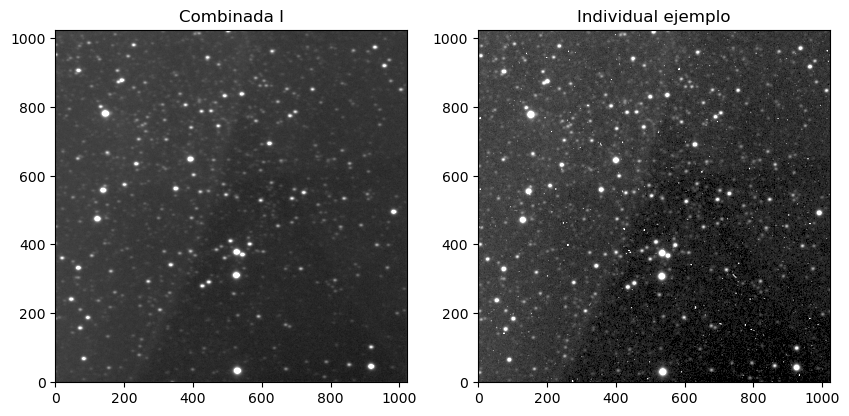

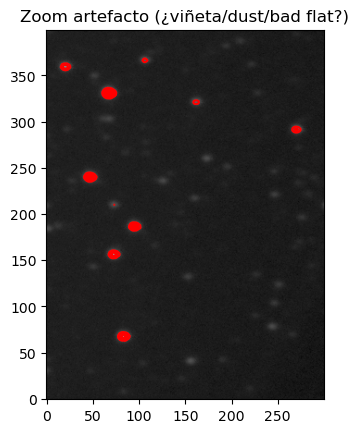

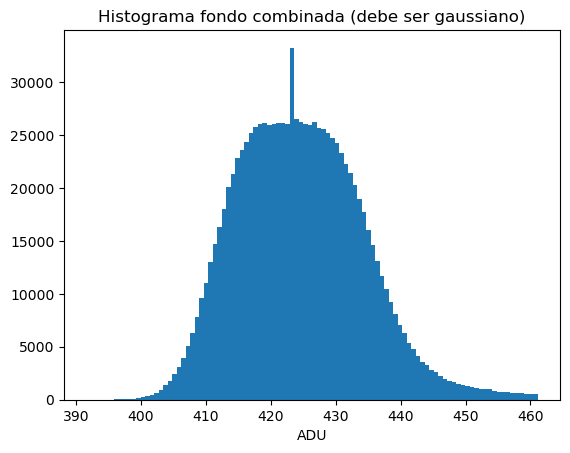

In [98]:
import numpy as np
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.visualization import simple_norm
import matplotlib.pyplot as plt
import glob

# Ajusta
comb_file = 'data/20250822bis/OGLE-2025-BLG-0451/OGLE-2025-BLG-0451_v_comb.fits'  # Ejemplo, ajusta al tuyo

indiv_files = glob.glob('data/20250822bis/OGLE-2025-BLG-0451/FBOGLE-2025-BLG-0451_v00*_wcs.fit')

def stats_image(filename):
    data = fits.getdata(filename).astype(float)
    mean, median, std = sigma_clipped_stats(data, sigma=3.0)
    print(f'\n{filename}:')
    print(f'  Fondo: media={mean:.1f}, mediana={median:.1f}, std={std:.1f} ADU')
    return data, std

# Stats
comb_data, comb_std = stats_image(comb_file)
for indiv in indiv_files:
    _, indiv_std = stats_image(indiv)
    print(f'  Ratio std comb/indiv: {comb_std/indiv_std:.2f} (ideal ~0.58 para 3 imgs bien combinadas)')

# Plots
norm = simple_norm(comb_data, 'sqrt', percent=99.5)

plt.figure(figsize=(10,5))
plt.subplot(121)
plt.imshow(comb_data, norm=norm, cmap='gray', origin='lower')
plt.title('Combinada I')
plt.subplot(122)
indiv_data = fits.getdata(indiv_files[0])
plt.imshow(indiv_data, norm=norm, cmap='gray', origin='lower')
plt.title('Individual ejemplo')
plt.savefig('comparacion_simple.png')
plt.show()

# Zoom artefacto (círculo abajo-izq)
zoom = comb_data[0:400, 0:300]  # Ajusta slice si el círculo está en otro lugar
plt.figure()
plt.imshow(zoom, norm=simple_norm(zoom, 'sqrt'), cmap='gray', origin='lower')
plt.contour(zoom, levels=10, colors='red')
plt.title('Zoom artefacto (¿viñeta/dust/bad flat?)')
plt.savefig('zoom_artefacto.png')
plt.show()

# Histograma fondo
plt.figure()
plt.hist(comb_data.flatten()[np.abs(comb_data.flatten() - np.median(comb_data)) < 4*comb_std], bins=100)
plt.title('Histograma fondo combinada (debe ser gaussiano)')
plt.xlabel('ADU')
plt.savefig('hist_fondo.png')
plt.show()

## fotometría 
### Catálogo de referncia

In [43]:
import pandas as pd
objects = pd.read_csv("objetos.csv")
objects

,objeto,ra_deg,dec_deg,ra_ecu,dec_ecu
0,OGLE-2025-BLG-0451,269.540958,-19.978000,17:58:09.83,-19:58:40.8
1,OGLE-2025-BLG-0397,269.713208,-39.597333,17:58:51.17,-39:35:50.4
2,OGLE-2025-BLG-0675,276.915333,-26.628806,18:27:39.68,-26:37:43.7
3,OGLE-2025-GD-0001,242.542333,-55.793667,16:10:10.16,-55:47:37.2


In [3]:
from astroquery.vizier import Vizier
from astropy.coordinates import SkyCoord
import astropy.units as u
# Catálogo ATLAS-REFCAT2 en VizieR
#catalog = "J/ApJ/867/105"
catalog = "J/ApJ/867/105/refcat2"

filter1 = 'r'
filter2 = 'g'
filter3 = 'i'
# Columnas equivalentes (ajusta si querés más: objID, RAJ2000, DEJ2000, gmag, e_gmag, etc.)
columns = ['objID', 'RAJ2000', 'DEJ2000', 
           filter1+'mag', 'e_'+filter1+'mag',
           filter2+'mag', 'e_'+filter2+'mag',
           filter3+'mag', 'e_'+filter3+'mag',
           'dup']  # dup para variables (equivalente a dupvar)

df = pd.read_csv("data/objetos.csv")
choice=0
idx = int(choice) if type(choice)==int else df[df['objeto'] == choice].index[0]

obj_name   = df.loc[idx, 'objeto']
ra_center  = df.loc[idx, 'ra_deg']
dec_center = df.loc[idx, 'dec_deg']
coord = SkyCoord(ra=ra_center*u.deg, dec=dec_center*u.deg)
radius = 4.2 * u.arcmin  # ~4.2 arcmin, como el original (0.07 deg)

v = Vizier(row_limit=500)  # Limita a 500 refs
res = v.query_region(coord, radius=radius, catalog=catalog)

In [5]:
res[0].to_pandas().columns

Index(['GaiaDR2', 'RA_ICRS', 'DE_ICRS', 'Plx', 'pmRA', 'pmDE', 'Gmag', 'BPmag',
       'RPmag', 'Teff', 'AG', 'dupvar', 'Ag', 'rp1', 'r1', 'r10', 'gmag',
       'rmag', 'imag', 'zmag', 'Jmag', 'Hmag', 'Kmag'],
      dtype='object')

In [94]:
from astroquery.gaia import Gaia
import pandas as pd
import numpy as np

# ============================================================
# 1. Parámetros del objeto
# ============================================================
objetos = pd.read_csv("objetos.csv")
idx = 2

ra  = objetos.loc[idx, "ra_deg"]
dec = objetos.loc[idx, "dec_deg"]
radius = 0.1  # grados (~3 arcmin)

# ============================================================
# 2. Query Gaia DR3 (estrellas brillantes y limpias)
# ============================================================
query = f"""
SELECT
    source_id,
    ra, dec,
    phot_g_mean_mag,
    phot_g_mean_flux_over_error,
    phot_bp_mean_mag,
    phot_bp_mean_flux_over_error,
    phot_rp_mean_mag,
    phot_rp_mean_flux_over_error
FROM gaiadr3.gaia_source
WHERE
    CONTAINS(
        POINT('ICRS', ra, dec),
        CIRCLE('ICRS', {ra}, {dec}, {radius})
    ) = 1
    AND phot_g_mean_mag BETWEEN 6 AND 15
    AND duplicated_source = 'false'
    AND phot_g_mean_flux_over_error > 100
    AND phot_bp_mean_flux_over_error > 50
    AND phot_rp_mean_flux_over_error > 50
"""#    AND visibility_periods_used >= 8
#"""

job = Gaia.launch_job(query)
df = job.get_results().to_pandas()
# ============================================================
# 3. Magnitudes Gaia y color
# ============================================================
df["G"]  = df["phot_g_mean_mag"]
df["BP"] = df["phot_bp_mean_mag"]
df["RP"] = df["phot_rp_mean_mag"]

df["color"] = df["BP"] - df["RP"]

# ------------------------------------------------------------
# Rango válido del polinomio
# https://gea.esac.esa.int/archive/documentation/GDR2/Data_processing/chap_cu5pho/sec_cu5pho_calibr/ssec_cu5pho_PhotTransf.html
# ------------------------------------------------------------
df = df[(df["color"] > -0.5) & (df["color"] < 2.75)]
'''
G−V=f(GBP−GRP)    −0.5<GBP−GRP<2.75
G−I=f(GBP−GRP)    −0.5<GBP−GRP<2.75
'''

# ============================================================
# 4. Transformaciones Gaia → Johnson–Cousins
#    https://gea.esac.esa.int/archive/documentation/GDR2/Data_processing/chap_cu5pho/sec_cu5pho_calibr/ssec_cu5pho_PhotTransf.html
# ============================================================
'''
		       GBP−GRP    (GBP−GRP)2          σ
G−V -0.01760	-0.006860	-0.1732			0.045858
G−I 0.02085	    0.7419	    -0.09631		0.04956
'''
# --- Johnson V ---
df["V"] = (
    df["G"]
    + 0.01760
    + 0.00686 * df["color"]
    + 0.1732  * df["color"]**2
)

# --- Cousins I ---
df["I"] = (
    df["G"]
    - 0.02085
    - 0.7419  * df["color"]
    + 0.09631 * df["color"]**2
)

# ============================================================
# 5. Errores fotométricos Gaia
# ============================================================
# 1.0857 = 2.5 / ln(10)
df["G_err"]  = 1.0857 / df["phot_g_mean_flux_over_error"]
df["BP_err"] = 1.0857 / df["phot_bp_mean_flux_over_error"]
df["RP_err"] = 1.0857 / df["phot_rp_mean_flux_over_error"]

df["color_err"] = np.sqrt(df["BP_err"]**2 + df["RP_err"]**2)

# ============================================================
# 6. Propagación correcta de errores (incluye σ del paper)
# ============================================================

# Coeficientes del polinomio
a1_V, a2_V = 0.00686, 0.1732
a1_I, a2_I = -0.7419, 0.09631

# Dispersión residual del paper
sigma_pol_V = 0.045858
sigma_pol_I = 0.04956

df["V_err"] = np.sqrt(
    df["G_err"]**2
    + (a1_V + 2*a2_V*df["color"])**2 * df["color_err"]**2
    + sigma_pol_V**2
)

df["I_err"] = np.sqrt(
    df["G_err"]**2
    + (a1_I + 2*a2_I*df["color"])**2 * df["color_err"]**2
    + sigma_pol_I**2
)
# ============================================================
# 7. Catálogo final para fotometría (autophot-ready)
# ============================================================
cols_out = ["SOURCE_ID", "RA", "DEC","G", "G_err",
    "BP", "BP_err","RP", "RP_err","color", "color_err",
    "V", "V_err","I", "I_err"]
df = df.rename(columns={'ra': 'RA', 'dec': 'DEC'})
df[cols_out].to_csv("refstars_VI_HSH.csv", index=False)

print("✅ Catálogo de estrellas de referencia VI generado correctamente.")


✅ Catálogo de estrellas de referencia VI generado correctamente.


In [45]:
df

,SOURCE_ID,RA,DEC,phot_g_mean_mag,phot_g_mean_flux_over_error,phot_bp_mean_mag,phot_bp_mean_flux_over_error,phot_rp_mean_mag,phot_rp_mean_flux_over_error,G,...,RP,color,V,I,G_err,BP_err,RP_err,color_err,V_err,I_err
0,4052005909510456448,276.949289,-26.717402,13.977848,1379.345215,15.461390,258.286896,12.795277,480.272675,13.977848,...,12.795277,2.666113,15.244871,12.663595,0.000787,0.004203,0.002261,0.004773,0.046079,0.049578
1,4052007936735335808,277.011142,-26.661913,14.042239,3785.956055,14.717141,496.423584,13.228939,345.756073,14.042239,...,13.228939,1.488202,14.453642,13.130594,0.000287,0.002187,0.003140,0.003827,0.045902,0.049591
2,4052052814977777792,276.890958,-26.707522,14.422536,2823.521484,15.307170,230.580597,13.451800,273.973602,14.422536,...,13.451800,1.855370,15.049087,13.356724,0.000385,0.004709,0.003963,0.006154,0.046034,0.049618
3,4052054047502138240,276.867574,-26.654397,13.438412,3421.630859,13.856640,722.932495,12.818728,593.672729,13.438412,...,12.818728,1.037911,13.649714,12.751287,0.000317,0.001502,0.001829,0.002366,0.045867,0.049578
4,4052054425461267456,276.957162,-26.676512,14.849044,3254.151855,15.640458,583.662476,13.977762,1033.229126,14.849044,...,13.977762,1.662696,15.356872,13.860894,0.000334,0.001860,0.001051,0.002136,0.045876,0.049569
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
291,4052054356739780096,276.858567,-26.625907,13.009674,4606.708984,13.731289,1532.298584,12.179822,2325.684326,13.009674,...,12.179822,1.551467,13.454818,12.069613,0.000236,0.000709,0.000467,0.000849,0.045861,0.049562
292,4052054464178190848,276.932247,-26.674637,14.253617,2303.667480,15.101510,564.020752,13.313380,821.599243,14.253617,...,13.313380,1.788130,14.837275,13.214096,0.000471,0.001925,0.001321,0.002335,0.045884,0.049571
293,4052055078294284800,277.013716,-26.617779,10.729904,5119.926758,11.292626,1472.821289,10.015359,2280.271973,10.729904,...,10.015359,1.277267,11.038827,9.918571,0.000212,0.000737,0.000476,0.000878,0.045860,0.049562
294,4052055628052479872,276.920847,-26.612621,14.666451,3609.264160,15.360210,546.433655,13.840036,1055.480591,14.666451,...,13.840036,1.520174,15.094733,13.740350,0.000301,0.001987,0.001029,0.002237,0.045875,0.049571


In [21]:
ra, dec

(269.5409583333333, -19.978)

In [49]:
cat = pd.read_csv("data/20250822bis/OGLE-2025-BLG-0451/OGLE-2025-BLG-0451_cat.csv")
cat = pd.read_csv("data/20250822bis/OGLE-2025-BLG-0675/OGLE-2025-BLG-0675_cat.csv")
# cat = pd.read_csv("refstars_VI_HSH.csv")
cat.columns

Index(['RA', 'Dec', 'Gmag', 'BPmag', 'RPmag', 'source'], dtype='object')

In [52]:
import numpy as np

c = np.loadtxt("data/20250822bis/OGLE-2025-BLG-0675/FBOGLE-2025-BLG-0675_i0031_wcs.fits.ctr")
print(c)


[[276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]
 [276.020222 -28.016073]


In [96]:
from astropy.io import fits
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import simple_norm
from astropy.coordinates import SkyCoord, search_around_sky
import astropy.units as u
from astroquery.vizier import Vizier
import pandas as pd
import os
ra_col = "RA"
dec_col = "Dec"
# Reemplaza con uno de tus archivos _scaled.fits o _trans.fits
filename = 'data/20250822bis/OGLE-2025-BLG-0451/OGLE-2025-BLG-0451_v_comb.fits'  # Ejemplo, ajusta al tuyo
#filename = 'data/20250822bis/OGLE-2025-BLG-0451/FBOGLE-2025-BLG-0451_v0003_wcs.fit'  # Ejemplo, ajusta al tuyo
filename = 'data/20250822bis/OGLE-2025-BLG-0675/FBOGLE-2025-BLG-0675_v0003_wcs.fits'  # Ejemplo, ajusta al tuyo



#hdul = fits.open(filename)  # Intenta fixear silenciosamente

fig, ax = plt.subplots( figsize=(5,5))
with fits.open(filename) as hdul:
    data = hdul[0].data
    w = WCS(hdul[0].header)

ax.imshow(data, cmap="gray",
          norm=simple_norm(data, "sqrt", percent=99.5),
          origin="lower")

with fits.open(filename) as hdul:
    data = hdul[0].data
    w = WCS(hdul[0].header)
    nx, ny = hdul[0].data.shape[1], hdul[0].data.shape[0]

ax.imshow(data, cmap="gray",
          norm=simple_norm(data, "sqrt", percent=99.5),
          origin="lower")


x, y = w.world_to_pixel_values(cat[ra_col],cat[dec_col])
#xc, yc = w.world_to_pixel_values(269.4233864583498, -20.01901521173966)
plt.plot(x,y, marker="o", ls="", ms=10, fillstyle="none")
#plt.plot(xc,yc, marker="x", ls="", ms=10, fillstyle="none")
#plt.plot(cat["x"], cat["y"], marker="o", ls="", ms=10, fillstyle="none")

center_x = nx / 2.0
center_y = ny / 2.0
ra_center, dec_center = w.all_pix2world(center_x, center_y, 0)
print(ra_center, dec_center)
xc, yc = w.world_to_pixel_values(ra_center, dec_center)
plt.plot(xc,yc, marker="x", ls="", ms=10, fillstyle="none")

plt.title("combined")

filename = 'data/20250822bis/OGLE-2025-BLG-0451/FBOGLE-2025-BLG-0451_v0003_wcs.fit' 
fig, ax = plt.subplots( figsize=(5,5))
with fits.open(filename) as hdul:
    data = hdul[0].data
    w = WCS(hdul[0].header)

ax.imshow(data, cmap="gray",
          norm=simple_norm(data, "sqrt", percent=99.5),
          origin="lower")

with fits.open(filename) as hdul:
    data = hdul[0].data
    w = WCS(hdul[0].header)
    nx, ny = hdul[0].data.shape[1], hdul[0].data.shape[0]

ax.imshow(data, cmap="gray",
          norm=simple_norm(data, "sqrt", percent=99.5),
          origin="lower")


x, y = w.world_to_pixel_values(cat[ra_col],cat[dec_col])
#xc, yc = w.world_to_pixel_values(269.4233864583498, -20.01901521173966)
plt.plot(x,y, marker="o", ls="", ms=10, fillstyle="none")
#plt.plot(xc,yc, marker="x", ls="", ms=10, fillstyle="none")
#plt.plot(cat["x"], cat["y"], marker="o", ls="", ms=10, fillstyle="none")

center_x = nx / 2.0
center_y = ny / 2.0
ra_center, dec_center = w.all_pix2world(center_x, center_y, 0)
print(ra_center, dec_center)
xc, yc = w.world_to_pixel_values(ra_center, dec_center)
plt.plot(xc,yc, marker="x", ls="", ms=10, fillstyle="none")

plt.title("single")
        


276.94908472151246 -26.614772745502155
269.54058572187324 -19.971358597656135


Text(0.5, 1.0, 'single')

In [26]:
hdul[0].header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 1024                                                  
NAXIS2  =                 1024                                                  
CCDSIZE = '[1:1024,1:1024] '     / CCD size                                     
CCDSUM  = '1 1 '                 / CCD binning factors                          
PIXSIZE1=                 24.0   / pixel size for axis 1 (um)                   
PIXSIZE2=                 24.0   / pixel size for axis 2 (um)                   
ADCRATE = '          '           / analog to digital converter rate             
GAIN    =                  2.0 / CCD gain (e-/ADU)                              
RDNOISE =                 15.7 / Readout noise (e- RMS)                         
CAMTEM  =                -49

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from photutils import DAOStarFinder
from astropy.stats import sigma_clipped_stats
from photutils import CircularAperture
from photutils.psf import IntegratedGaussianPRF, DAOPhotPSFPhotometry
from astropy.modeling import models, fitting

# ---------------------------------------------------------------------
# 1) Calcular sigma-clipped stats de la imagen para el umbral
mean, median, std = sigma_clipped_stats(data, sigma=3.0)

# ---------------------------------------------------------------------
# 2) Detectar fuentes usando DAOStarFinder (aprox. tamaño FWHM)
# Nota: fwhm aquí es solo un guess inicial para DAOStarFinder
daofind = DAOStarFinder(fwhm=5, threshold=5*std)
sources = daofind(data - median)

# ---------------------------------------------------------------------
# 3) Convertir posiciones a lista de (x, y) para PSF/FWHM
positions = np.array(list(zip(sources['xcentroid'], sources['ycentroid'])))

# ---------------------------------------------------------------------
# 4) Medir FWHM de cada fuente usando un ajuste gaussiano 2D
fwhm_list = []
for x, y in positions:
    # Extraer una pequeña subimagen centrada en la estrella
    size = 11  # píxeles
    x_min = int(x - size//2)
    x_max = int(x + size//2 + 1)
    y_min = int(y - size//2)
    y_max = int(y + size//2 + 1)
    
    if x_min < 0 or y_min < 0 or x_max > data.shape[1] or y_max > data.shape[0]:
        continue
    
    stamp = data[y_min:y_max, x_min:x_max]
    
    # Coordenadas de la subimagen
    yy, xx = np.mgrid[:stamp.shape[0], :stamp.shape[1]]
    
    # Ajuste gaussiano
    g_init = models.Gaussian2D(amplitude=stamp.max(), x_mean=size//2, y_mean=size//2,
                               x_stddev=2, y_stddev=2)
    fit_g = fitting.LevMarLSQFitter()
    
    try:
        g = fit_g(g_init, xx, yy, stamp)
        fwhm_x = 2.3548 * g.x_stddev.value
        fwhm_y = 2.3548 * g.y_stddev.value
        fwhm_list.append((fwhm_x + fwhm_y)/2)
    except:
        continue

fwhm_array = np.array(fwhm_list)

# ---------------------------------------------------------------------
# 5) Verificar FWHM calculada
print(f"FWHM estimada promedio: {np.mean(fwhm_array):.2f} pix")
print(f"Desviación estándar: {np.std(fwhm_array):.2f} pix")
print(f"Rango FWHM: {np.min(fwhm_array):.2f} - {np.max(fwhm_array):.2f} pix")

# ---------------------------------------------------------------------
# 6) Histograma
plt.figure(figsize=(8,4))
plt.hist(fwhm_array, bins=30, color='dodgerblue', edgecolor='k')
plt.xlabel("FWHM [pix]")
plt.ylabel("Nº de estrellas")
plt.title("Distribución de FWHM de fuentes detectadas")
plt.show()


In [39]:
filename = 'data/20250822bis/OGLE-2025-BLG-0397_i0004.fit' 
with fits.open(filename) as hdul:
    data = hdul[0].data
    w = WCS(hdul[0].header)
hdul[0].header["PIXSCALE"]

0.53

In [309]:
ny, nx = data.shape
print("Centro geométrico:", nx/2, ny/2)
print("CRPIX:", w.wcs.crpix)


Centro geométrico: 512.0 512.0
CRPIX: [0. 0.]


In [310]:
with fits.open(filename) as hdul:
    w = WCS(hdul[0].header)
    nx, ny = hdul[0].data.shape
print(nx,ny)
center_x = nx / 2.0
center_y = ny / 2.0
ra_center, dec_center = w.all_pix2world(center_x, center_y, 0)
print(ra_center, dec_center)
xc, yc = w.world_to_pixel_values(ra_center, dec_center)
print(xc,yc)

1024 1024
269.4233864583498 -20.01901521173966
511.99999999997544 512.0000000000057


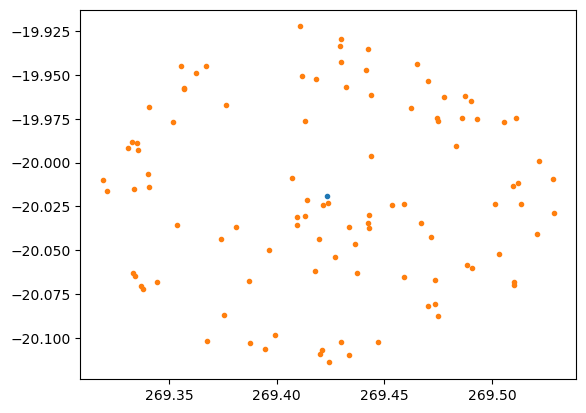

In [293]:
plt.plot(269.4233864583498, -20.01901521173966, ".")
plt.plot(cat["RA"], cat["Dec"], ".")

In [294]:
os.path.join(img_dir, img)

'data/20250822bis/OGLE-2025-BLG-0451/FBOGLE-2025-BLG-0451_v0004_wcs.fit'

In [296]:
from astropy.io import fits
from astropy.wcs import WCS

# Ajusta a tus paths reales
individual_file = 'data/20250822bis/OGLE-2025-BLG-0451/FBOGLE-2025-BLG-0451_v0003_wcs.fit'  # Individual con WCS bueno
combined_file = 'data/20250822bis/OGLE-2025-BLG-0451/OGLE-2025-BLG-0451_v_comb.fits'  # Combinada actual

def test_wcs(file):
    with fits.open(file) as hdul:
        header = hdul[0].header
        w = WCS(header)
        nx, ny = hdul[0].data.shape
        ra, dec = w.all_pix2world(nx/2, ny/2, 0)
        print(f'{file}:')
        print(f'  Centro RA={ra:.5f}°, Dec={dec:.5f}°')
        print(f'  CRPIX1={header.get("CRPIX1", "no")}, CRPIX2={header.get("CRPIX2", "no")}')
        print(f'  CRVAL1={header.get("CRVAL1", "no")}, CRVAL2={header.get("CRVAL2", "no")}')
        print(f'  CD1_1={header.get("CD1_1", "no")}, CD1_2={header.get("CD1_2", "no")}')
        print(f'  CD2_1={header.get("CD2_1", "no")}, CD2_2={header.get("CD2_2", "no")}')

test_wcs(individual_file)
test_wcs(combined_file)

data/20250822bis/OGLE-2025-BLG-0451/FBOGLE-2025-BLG-0451_v0003_wcs.fit:
  Centro RA=269.54059°, Dec=-19.97136°
  CRPIX1=710.132766724, CRPIX2=304.083176613
  CRVAL1=269.507902969, CRVAL2=-19.939034141
  CD1_1=-0.000155219820383, CD1_2=5.66831681105e-07
  CD2_1=-5.83524744061e-07, CD2_2=-0.000155288998279
data/20250822bis/OGLE-2025-BLG-0451/OGLE-2025-BLG-0451_v_comb.fits:
  Centro RA=269.42339°, Dec=-20.01902°
  CRPIX1=no, CRPIX2=no
  CRVAL1=269.507883691, CRVAL2=-19.9390477443
  CD1_1=-0.000155268624739, CD1_2=5.08478081953e-07
  CD2_1=-6.30956472719e-07, CD2_2=-0.000155290213374


In [ ]:
λ = 69°18′23.9″ W

Eso equivale a 69.306638° Oeste

In [24]:
69+18/60+23.9/(60*60)

69.30663888888888

In [ ]:
 -31°47’14”.4

In [25]:
-31-47/60-14.4/(60*60)

-31.787333333333336